# Lecture 6: From Unstructured Text to Structured Data - Part I
### [The Art of Analyzing Big Data - The Data Scientist’s Toolbox](https://www.ise.bgu.ac.il/labs/fire/lectures.html) 

---


## 0. Package Setup
For this lecture, we are going to use the [Kaggle](https://github.com/Kaggle/kaggle-api), [TuriCreate](https://github.com/apple/turicreate), [Gensim](https://radimrehurek.com/gensim/), [pyLDAvis](https://github.com/bmabey/pyLDAvis/blob/master/README.rst), [spacy](https://spacy.io), and [Afinn](https://github.com/fnielsen/afinn) packages. Let's set them up:

In [0]:
!pip install turicreate
!pip install kaggle 
!pip install gensim
!pip install pyLDAvis
!pip install spaCy
!pip install afinn


In [0]:
#setting up Kaggle & TuriCreate package s
import json
import os

!mkdir /root/.kaggle/
# Installing the Kaggle package

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"<Insert Your Kaggle User Name>","key":"<Insert Your Kaggle API key>"}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive

with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

We also going to  use [The Blog Authorship Corpus](http://u.cs.biu.ac.il/~koppel/BlogCorpus.htm) from [Lecture 5 -  Notebook](https://colab.research.google.com/drive/1a37gzN4eAGCVhAooTawAbwuUW13Vxqlc). Let's download it this time from [Kaggle](https://www.kaggle.com/rtatman/blog-authorship-corpus):

In [0]:
!mkdir ./datasets
!mkdir ./datasets/BIU-Blog-Authorship

# download the dataset from Kaggle and unzip it
!kaggle datasets download rtatman/blog-authorship-corpus -p ./datasets/BIU-Blog-Authorship
!unzip ./datasets/BIU-Blog-Authorship/*.zip  -d ./datasets/BIU-Blog-Authorship/


 97% 281M/290M [00:06<00:00, 50.5MB/s]
100% 290M/290M [00:06<00:00, 48.4MB/s]
Archive:  ./datasets/BIU-Blog-Authorship/blog-authorship-corpus.zip
  inflating: ./datasets/BIU-Blog-Authorship/blogtext.csv  


## 1. Bag-of-Words

Creating a document's bag-of-words is relatively simple using the [Python NLTK package](https://www.nltk.org/).
Let's use [The Blog Authorship Corpus](http://u.cs.biu.ac.il/~koppel/BlogCorpus.htm) 

(see [Lecture 5 -  Notebook](https://colab.research.google.com/drive/1a37gzN4eAGCVhAooTawAbwuUW13Vxqlc)).
Let's use NLTK and create s a bag-of-words of a blog post:

In [0]:
import nltk
import turicreate as tc
from nltk.tokenize import word_tokenize


nltk.download('punkt') # need to download punkt package from NLTK
DATA_SETS_PATH = "./datasets/BIU-Blog-Authorship"
#getting a blog post
sf = tc.SFrame.read_csv(f"{DATA_SETS_PATH}/blogtext.csv")
sf

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 100 lines in 0.846593 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 44265 lines. Lines per second: 42681.4

Read 451285 lines. Lines per second: 73977

Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 681284 lines in 8.73847 secs.

id,gender,age,topic,sign,date,text
2059027,male,15,Student,Leo,"14,May,2004","Info has beenfound (+/- 100 pages, ..."
2059027,male,15,Student,Leo,"13,May,2004",These are theteam members: Drewes ...
2059027,male,15,Student,Leo,"12,May,2004",In het kadervan kernfusie op aarde: ...
2059027,male,15,Student,Leo,"12,May,2004",testing!!!testing!!! ...
3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",Thanks toYahoo!'s Toolbar I can ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",I had aninteresting conversation ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",SomehowCoca-Cola has a way of ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004","If anything,Korea is a country of ..."
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",Take a readof this news article ...
3581210,male,33,InvestmentBanking,Aquarius,"09,June,2004",I surf theEnglish news sites a lot ...


In [0]:
sf['text']

dtype: str
Rows: 681284
['           Info has been found (+/- 100 pages, and 4.5 MB of .pdf files) Now i have to wait untill our team leader has processed it and learns html.         ', '           These are the team members:   Drewes van der Laag           urlLink mail  Ruiyu Xie                     urlLink mail  Bryan Aaldering (me)          urlLink mail          ', "           In het kader van kernfusie op aarde:  MAAK JE EIGEN WATERSTOFBOM   How to build an H-Bomb From: ascott@tartarus.uwa.edu.au (Andrew Scott) Newsgroups: rec.humor Subject: How To Build An H-Bomb (humorous!) Date: 7 Feb 1994 07:41:14 GMT Organization: The University of Western Australia  Original file dated 12th November 1990. Seemed to be a transcript of a 'Seven Days' article. Poorly formatted and corrupted. I have added the text between 'examine under a microscope' and 'malleable, like gold,' as it was missing. If anyone has the full text, please distribute. I am not responsible for the accuracy of this informa

Now, we will turn the string to lowercase, split the text into words, and count the number of time each word appears:

In [0]:
from collections import Counter
import re

blog_post = sf['text'][100]
blog_post = blog_post.lower()
words_list = word_tokenize(blog_post) # we can also tokenize the text using other methods
words_list

['i',
 'ca',
 "n't",
 'wait',
 'for',
 'things',
 'to',
 'get',
 'moving',
 ',',
 'i',
 'want',
 'out',
 'of',
 'here',
 '.',
 'im',
 'lookin',
 'forward',
 'to',
 'uni',
 'although',
 'it',
 'means',
 'another',
 '3',
 'years',
 'in',
 'england',
 '.',
 'it',
 'should',
 'be',
 'so',
 'much',
 'fun',
 'from',
 'my',
 'experiences',
 'of',
 'it',
 'so',
 'far',
 'and',
 'my',
 'brother',
 "'s",
 'experiences',
 '.',
 'after',
 'uni',
 'though',
 'it',
 'will',
 'be',
 'another',
 'year',
 'i',
 'guess',
 'before',
 'i',
 'can',
 'move',
 ',',
 'as',
 'i',
 "'ll",
 'need',
 'to',
 'work',
 'for',
 "'bout",
 'that',
 'long',
 'to',
 'get',
 'some',
 'money',
 '.',
 'will',
 'be',
 'quite',
 'lonely',
 'i',
 'imagine',
 'as',
 'every1',
 'will',
 'have',
 'moved',
 'on',
 'by',
 'then',
 '.',
 'i',
 'wana',
 'work',
 'in',
 'a',
 'pub',
 ',',
 'duno',
 'why',
 ',',
 'not',
 'any',
 'pub',
 ',',
 'not',
 'a',
 'big',
 'pub',
 ',',
 'i',
 "'d",
 'love',
 'to',
 'work',
 'the',
 'fox',
 'n',

In [0]:
c = Counter(words_list)
c.most_common(10)

[('i', 33),
 (',', 21),
 ('to', 17),
 ('.', 17),
 ('it', 15),
 ('a', 13),
 ('the', 11),
 ('for', 10),
 ('that', 10),
 ('im', 9)]

We get a Bag-of-Words of the post. However, as can be seen, many of the most common words are words like "i," "to," and "the," i.e., [stopwords](https://en.wikipedia.org/wiki/Stop_words). In many cases, it may be better to remove the stopwords from our model (but not always). Let's remove the stopwords:

In [0]:
nltk.download('stopwords')
from nltk.corpus import stopwords

stop_words_set = set(stopwords.words("english"))
words_list = [w for w in words_list if w not in stop_words_set]
c = Counter(words_list)
c.most_common(10)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[(',', 21),
 ('.', 17),
 ('im', 9),
 ("'s", 9),
 ('n', 8),
 ('wana', 7),
 ('...', 6),
 ('work', 4),
 ('-', 4),
 (':', 4)]

We can also remove punctuation marks (although they can be useful):

In [0]:
import re
re_words = re.compile(r"(\w+)")
l = re_words.findall(blog_post)
l = [w for w in l if w not in stop_words_set]
c = Counter(l)
c.most_common(10)

[('im', 9),
 ('n', 8),
 ('wana', 7),
 ('work', 4),
 ('gona', 4),
 ('fun', 3),
 ('year', 3),
 ('pub', 3),
 ('love', 3),
 ('hav', 3)]

Let's group the texts and generate a single long text for each blogger:

In [0]:
import turicreate.aggregate as agg
g = sf.groupby(['id', 'gender', 'topic', 'sign'], {'posts_list': agg.CONCAT('text')})
g['all_text'] = g['posts_list'].apply(lambda l: ' '.join(l))
g

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Back inBoston. Cold. I saw ...,Back inBoston. Cold. I saw ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


Let's create a new column with a bag-of-words of each blog:

In [0]:
g['words_dict'] = tc.text_analytics.count_words(g['all_text'])
g.materialize()
g

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Back inBoston. Cold. I saw ...,Back inBoston. Cold. I saw ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
g[100]['words_dict']

{'100': 1.0,
 '18': 1.0,
 '2': 1.0,
 '20': 1.0,
 '200': 2.0,
 '26': 1.0,
 '3': 1.0,
 'a': 31.0,
 'abilities': 1.0,
 'ability': 1.0,
 'about': 4.0,
 'addiction': 1.0,
 'admit': 1.0,
 'advanced': 1.0,
 'after': 3.0,
 'again': 1.0,
 'ago': 2.0,
 'alas': 1.0,
 'all': 5.0,
 'along': 1.0,
 'also': 7.0,
 'amazing': 2.0,
 'an': 5.0,
 'and': 28.0,
 'another': 2.0,
 'any': 2.0,
 'are': 2.0,
 'area': 1.0,
 'army': 1.0,
 'as': 11.0,
 'at': 1.0,
 'avid': 1.0,
 'b': 1.0,
 'back': 1.0,
 'bad': 1.0,
 'based': 1.0,
 'battles': 2.0,
 'bay': 1.0,
 'be': 6.0,
 'became': 1.0,
 'because': 1.0,
 'been': 4.0,
 'before': 1.0,
 'best': 1.0,
 'better': 2.0,
 'big': 1.0,
 'billionaire': 1.0,
 'blacksmith': 1.0,
 'bootleg': 1.0,
 'borderline': 1.0,
 'both': 2.0,
 'bought': 2.0,
 'broke': 1.0,
 'bucks': 2.0,
 'build': 2.0,
 'built': 1.0,
 'but': 15.0,
 'buy': 1.0,
 'buying': 1.0,
 'by': 3.0,
 'calibur': 1.0,
 'called': 1.0,
 'came': 1.0,
 'can': 3.0,
 'capcom': 2.0,
 'castle': 2.0,
 'character': 3.0,
 'characters':

We can use this column to predict various bloggers' properties:

In [0]:
test, train  = g.random_split(0.2)
print(f"Train size {len(train)}\nTest size: {len(test)}" )
features_list = ['words_dict']
cls = tc.classifier.create(train,features=features_list, target="gender")

Train size 15583
Test size: 3737
PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: LogisticClassifier, SVMClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Logistic regression:

--------------------------------------------------------

Number of examples          : 14803

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 650536

Number of coefficients      : 650537

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 6        | 0.108900  | 3.500305     | 0.939742          | 0.687179            |

| 1         | 8        | 0.108900  | 5.036435     | 0.953185          | 0.702564            |

| 2         | 9        | 0.136125  | 5.993970     | 0.956563          | 0.702564            |

| 3         | 10       | 0.170156  | 6.955076     | 0.962710          | 0.697436            |

| 4         | 11       | 0.212695  | 7.914735     | 0.969128          | 0.701282            |

| 9         | 16       | 0.649095  | 12.736346    | 0.987975          | 0.714103            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

SVM:

--------------------------------------------------------

Number of examples          : 14803

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 650536

Number of coefficients    : 650537

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 3        | 0.500000  | 1.329312     | 0.939742          | 0.687179            |

| 1         | 5        | 0.500000  | 2.563177     | 0.965548          | 0.702564            |

| 2         | 6        | 0.625000  | 3.373146     | 0.975410          | 0.700000            |

| 3         | 7        | 0.781250  | 4.185250     | 0.982436          | 0.703846            |

| 4         | 9        | 0.899943  | 5.423291     | 0.985206          | 0.703846            |

| 9         | 23       | 0.783650  | 13.400162    | 0.989056          | 0.706410            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: LogisticClassifier              : 0.7141025641025641
PROGRESS: SVMClassifier                   : 0.7064102564102565
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


In [0]:
cls.evaluate(test)

{'accuracy': 0.7345464276157345,
 'auc': 0.7938170943168323,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  253  |
 |     male     |      female     |  739  |
 |     male     |       male      |  1162 |
 |    female    |      female     |  1583 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.7008443908323281,
 'log_loss': 0.9807573052996735,
 'precision': 0.8212014134275618,
 'recall': 0.6112572330352446,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+--------------------+--------------------+------+------+
 | threshold |        fpr         |        tpr         |  p   |  n   |
 +-----------+--------------------+--------------------+------+------+
 |    0.0  

We get a classifier with AUC of 0.79, and we can also create a classifier that predict the blog's
topic:

In [0]:
tc.config.get_runtime_config()

{'TURI_CACHE_FILE_HDFS_LOCATION': '',
 'TURI_CACHE_FILE_LOCATIONS': '/var/tmp',
 'TURI_DEFAULT_NUM_GRAPH_LAMBDA_WORKERS': 16,
 'TURI_DEFAULT_NUM_PYLAMBDA_WORKERS': 16,
 'TURI_FAST_COMPACT_BLOCKS_IN_SMALL_SEGMENT': 8,
 'TURI_FILEIO_ALTERNATIVE_SSL_CERT_DIR': '',
 'TURI_FILEIO_ALTERNATIVE_SSL_CERT_FILE': '/usr/local/lib/python3.6/dist-packages/certifi/cacert.pem',
 'TURI_FILEIO_INSECURE_SSL_CERTIFICATE_CHECKS': 0,
 'TURI_FILEIO_MAXIMUM_CACHE_CAPACITY': 6848435200,
 'TURI_FILEIO_MAXIMUM_CACHE_CAPACITY_PER_FILE': 6848435200,
 'TURI_FILEIO_MAX_REMOTE_FS_CACHE_ENTRIES': 0,
 'TURI_FORCE_IPC_TO_TCP_FALLBACK': 0,
 'TURI_GLOBALS_PYTHON_EXECUTABLE': '/usr/bin/python3',
 'TURI_LAMBDA_WORKER_CONNECTION_TIMEOUT': 60.0,
 'TURI_MIN_SECONDS_BETWEEN_TICK_PRINTS': 3.0,
 'TURI_ML_DATA_STATS_PARALLEL_ACCESS_THRESHOLD': 1048576,
 'TURI_ML_DATA_TARGET_ROW_BYTE_MINIMUM': 262144,
 'TURI_NUM_GPUS': -1,
 'TURI_S3_ENDPOINT': '',
 'TURI_S3_REGION': '',
 'TURI_SFRAME_COMPACTION_THRESHOLD': 256,
 'TURI_SFRAME_CSV_PA

In [0]:
tc.config.set_runtime_config('TURI_DEFAULT_NUM_PYLAMBDA_WORKERS',12)

In [0]:
#can take a long time
cls = tc.boosted_trees_classifier.create(train,features=['words_dict'], target="topic",row_subsample=0.8,column_subsample=0.5)
m = cls.evaluate(test)
m


PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14803

Number of classes           : 40

Number of feature columns   : 1

Number of unpacked features : 651414

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 24.242056    | 0.413295          | 0.406410            | 2.510747          | 2.605527            |

| 2         | 49.693894    | 0.442208          | 0.396154            | 2.272828          | 2.465388            |

| 3         | 74.136223    | 0.467608          | 0.400000            | 2.098337          | 2.371459            |

| 4         | 98.551991    | 0.483483          | 0.401282            | 1.958015          | 2.308692            |

| 5         | 124.786203   | 0.500844          | 0.398718            | 1.844779          | 2.255357            |

| 7         | 173.926907   | 0.536243          | 0.392308            | 1.647720          | 2.191696            |

| 8         | 198.510730   | 0.552523          | 0.400000            | 1.561308          | 2.173877            |

| 9         | 223.130539   | 0.566845          | 0.401282            | 1.482985          | 2.157432            |

| 10        | 247.767875   | 0.580963          | 0.402564            | 1.408684          | 2.141752            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

{'accuracy': 0.37302649183837305,
 'auc': 0.6084876063549384,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 160
 
 Data:
 +-------------------+-----------------+-------+
 |    target_label   | predicted_label | count |
 +-------------------+-----------------+-------+
 |    Advertising    |     Student     |   6   |
 |       indUnk      |     Internet    |   2   |
 |     Education     |      indUnk     |   86  |
 |     Non-Profit    |       Arts      |   2   |
 |    Engineering    |      indUnk     |   49  |
 | Museums-Libraries |    Education    |   1   |
 |     Publishing    |       Arts      |   1   |
 |      Religion     |      indUnk     |   25  |
 |    Advertising    |      indUnk     |   16  |
 | Museums-Libraries |    Publishing   |   1   |
 +-------------------+-----------------+-------+
 [160 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and co

In [0]:
m['confusion_matrix'].sort('count', ascending=False)

target_label,predicted_label,count
indUnk,indUnk,843
Student,Student,508
Student,indUnk,463
indUnk,Student,441
Technology,indUnk,131
Arts,indUnk,101
Education,indUnk,86
Communications-Media,indUnk,76
Education,Student,63
Engineering,indUnk,49


By transferring blogs into their bag-of-words representation, we created a classifier which can predict the topic of a blog out of 40 topics with accuracy of about 0.37. Let's see if we can improve the classifier’s accuracy by removing stopwords:

In [0]:
test, train  = g.random_split(0.2)
g['words_dict_no_stop'] = g['words_dict'].dict_trim_by_keys(tc.text_analytics.stop_words(lang='en'), exclude=True)
%time cls1 = tc.boosted_trees_classifier.create(train,features=['words_dict'], target="gender")
%time cls2 = tc.boosted_trees_classifier.create(train,features=['words_dict_no_stop'], target="gender")


PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14614

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 638184

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.782256     | 0.690092          | 0.624675            | 0.639655          | 0.661087            |

| 2         | 3.521810     | 0.728137          | 0.645455            | 0.600392          | 0.633473            |

| 3         | 5.269980     | 0.747366          | 0.663636            | 0.568150          | 0.616157            |

| 4         | 6.994202     | 0.763925          | 0.680519            | 0.541622          | 0.596451            |

| 5         | 8.704009     | 0.773573          | 0.685714            | 0.523425          | 0.587445            |

| 10        | 17.296709    | 0.815382          | 0.722078            | 0.450452          | 0.552746            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

CPU times: user 2min 47s, sys: 1.45 s, total: 2min 49s
Wall time: 1min 2s
PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14614

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 635336

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.669486     | 0.697824          | 0.677922            | 0.640405          | 0.651291            |

| 2         | 3.292451     | 0.716573          | 0.690909            | 0.604765          | 0.626236            |

| 3         | 4.920192     | 0.734980          | 0.712987            | 0.576717          | 0.602840            |

| 4         | 6.542166     | 0.756056          | 0.719481            | 0.552193          | 0.582687            |

| 5         | 8.109885     | 0.767210          | 0.735065            | 0.536344          | 0.572617            |

| 10        | 16.149900    | 0.802723          | 0.754545            | 0.464425          | 0.529662            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

CPU times: user 2min 51s, sys: 1.49 s, total: 2min 52s
Wall time: 1min 2s


In [0]:
cls1.evaluate(test)

{'accuracy': 0.7362804878048781,
 'auc': 0.8118303029677076,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  550  |
 |     male     |      female     |  488  |
 |    female    |      female     |  1416 |
 |     male     |       male      |  1482 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.7406296851574213,
 'log_loss': 0.5405345485330063,
 'precision': 0.7293307086614174,
 'recall': 0.7522842639593909,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1970 | 1966 |
 |   1e-05   | 1.0 | 1.0 | 1970 | 1966 |
 |   2e-05   | 1.0 

In [0]:
cls2.evaluate(test)

{'accuracy': 0.7289126016260162,
 'auc': 0.8082340137670334,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |     male     |       male      |  1440 |
 |    female    |      female     |  1429 |
 |    female    |       male      |  537  |
 |     male     |      female     |  530  |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.7296681023562198,
 'log_loss': 0.5466427945848948,
 'precision': 0.7283763277693475,
 'recall': 0.7309644670050761,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1970 | 1966 |
 |   1e-05   | 1.0 | 1.0 | 1970 | 1966 |
 |   2e-05   | 1.0 

We can see from the above results that blindly removing stop-words can decrease the classifier performance.
It is important to remember  to not always remove stop-words automatically. 

## 2. N-Grams

Similar to calculating a bag-of-words, we can calculate  various n-grams from the blog posts and utilize them to predict
various blog properties. Let's calculate each blogs 2-grams and 3-grams both using TuriCreate's [count_ngrams](https://apple.github.io/turicreate/docs/api/generated/turicreate.text_analytics.count_ngrams.html#turicreate-text-analytics-count-ngrams) function:

In [0]:
import turicreate as tc
import turicreate.aggregate as agg

DATA_SETS_PATH = "./datasets/BIU-Blog-Authorship"
sf = tc.SFrame.read_csv(f"{DATA_SETS_PATH}/blogtext.csv")
g = sf.groupby(['id', 'gender', 'topic', 'sign'], {'posts_list': agg.CONCAT('text')})
g['all_text'] = g['posts_list'].apply(lambda l: ' '.join(l))
g

Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 100 lines in 0.846301 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 44265 lines. Lines per second: 42293.2

Read 363396 lines. Lines per second: 57811.1

Read 579690 lines. Lines per second: 48104.4

Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 681284 lines in 13.8737 secs.

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Boughta really detailed map of ...,Bought areally detailed map of ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
g['words_1grams'] = tc.text_analytics.count_ngrams(g['all_text'], n=1, method='word')
g['words_2grams'] = tc.text_analytics.count_ngrams(g['all_text'], n=2, method='word')
g['words_3grams'] = tc.text_analytics.count_ngrams(g['all_text'], n=3, method='word')
g.materialize()
g

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Boughta really detailed map of ...,Bought areally detailed map of ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
g['words_2grams']

dtype: dict
Rows: 19320
[{'need is': 1, 'you need': 1, 'skit all': 1, 'pl skit': 1, 'yg sang': 1, 'vocations and': 1, 'nitpicking about': 1, 'do nitpicking': 1, 'ever do': 1, 'liked focusing': 1, 'never liked': 1, 'ive never': 1, 'details but': 1, 'someone once': 1, 'and apparently': 1, 'important and': 1, 'are important': 1, 'is details': 1, 'realizing that': 1, 'm realizing': 1, 'basically i': 1, 'that point': 1, '56am so': 1, '3 56am': 1, 'being 3': 1, 'tired being': 1, 'im quite': 1, 'ideas and': 1, 'mind around': 1, 'to wrap': 1, 'its hard': 1, 'love its': 1, 'universal love': 1, 'then of': 1, 'what then': 1, 'humans being': 1, 'among humans': 1, 'd be': 1, 'seems i': 1, 'logically it': 1, 'wife than': 1, 'stronger commitment': 1, 'a stronger': 1, 'were to': 1, 'obvious example': 1, 'most obvious': 1, 'humanness the': 1, 'the second': 1, 'but within': 1, 'first two': 1, 'to doing': 1, 'commit myself': 1, 'only need': 1, 'i only': 1, 'to and': 1, 'will s': 1, 'god will': 1, 'creati

In [0]:
# we have more than 12 million unique ngrams, we need to remove the rare ngrams
g['words_2grams'] = g['words_2grams'].apply(lambda d: {k:v for k,v in d.items() if v > 5})
g['words_3grams'] = g['words_3grams'].apply(lambda d: {k:v for k,v in d.items() if v > 5})
g.materialize()

In [0]:
test, train  = g.random_split(0.2)
cls1 = tc.boosted_trees_classifier.create(train,features=['words_2grams'], target="gender")


PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14648

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 126913

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.349984     | 0.634967          | 0.622568            | 0.662465          | 0.673818            |

| 2         | 0.670870     | 0.653195          | 0.651102            | 0.641566          | 0.660908            |

| 3         | 0.990909     | 0.663504          | 0.642023            | 0.625900          | 0.651956            |

| 4         | 1.306840     | 0.666985          | 0.647211            | 0.616313          | 0.647271            |

| 5         | 1.618727     | 0.672788          | 0.647211            | 0.608677          | 0.645343            |

| 10        | 3.117889     | 0.691903          | 0.661479            | 0.578950          | 0.630289            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls2 = tc.boosted_trees_classifier.create(train,features=['words_3grams'], target="gender")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14648

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 82621

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.086008     | 0.567518          | 0.529183            | 0.680824          | 0.687957            |

| 2         | 0.164750     | 0.572911          | 0.529183            | 0.672198          | 0.684986            |

| 3         | 0.243686     | 0.577826          | 0.539559            | 0.665995          | 0.681023            |

| 4         | 0.323953     | 0.578714          | 0.539559            | 0.662083          | 0.679966            |

| 5         | 0.409669     | 0.584995          | 0.534371            | 0.656798          | 0.679824            |

| 10        | 0.812772     | 0.595918          | 0.544747            | 0.643283          | 0.677559            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls1.evaluate(test)

{'accuracy': 0.6508587541655986,
 'auc': 0.710345511945975,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  758  |
 |     male     |      female     |  604  |
 |     male     |       male      |  1362 |
 |    female    |      female     |  1177 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.6666666666666667,
 'log_loss': 0.623090028046819,
 'precision': 0.6424528301886793,
 'recall': 0.6927772126144456,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1966 | 1935 |
 |   1e-05   | 1.0 | 1.0 | 1966 | 1935 |
 |   2e-05   | 1.0 | 

In [0]:
cls2.evaluate(test)

{'accuracy': 0.5716482953088952,
 'auc': 0.5917009050499317,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  1298 |
 |     male     |      female     |  373  |
 |     male     |       male      |  1593 |
 |    female    |      female     |  637  |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.6559604694255713,
 'log_loss': 0.6719528267937954,
 'precision': 0.5510204081632653,
 'recall': 0.8102746693794507,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1966 | 1935 |
 |   1e-05   | 1.0 | 1.0 | 1966 | 1935 |
 |   2e-05   | 1.0 

We can also use all features combined:

In [0]:
cls = tc.boosted_trees_classifier.create(train,features=['words_1grams'], target="gender")
cls.evaluate(test)

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14648

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 644634

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.883376     | 0.701939          | 0.665370            | 0.639387          | 0.652150            |

| 2         | 3.820303     | 0.729519          | 0.691310            | 0.600513          | 0.626427            |

| 3         | 5.650963     | 0.740306          | 0.693904            | 0.572988          | 0.604281            |

| 4         | 7.482487     | 0.755530          | 0.699092            | 0.547745          | 0.588183            |

| 5         | 9.291025     | 0.769388          | 0.709468            | 0.527069          | 0.577052            |

| 10        | 18.309896    | 0.809940          | 0.732815            | 0.457826          | 0.537745            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

{'accuracy': 0.7459625736990515,
 'auc': 0.8273215726786889,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  476  |
 |     male     |      female     |  515  |
 |     male     |       male      |  1451 |
 |    female    |      female     |  1459 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.7454405342923195,
 'log_loss': 0.5283857444439967,
 'precision': 0.7529839128178516,
 'recall': 0.7380467955239064,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1966 | 1935 |
 |   1e-05   | 1.0 | 1.0 | 1966 | 1935 |
 |   2e-05   | 1.0 

In [0]:
cls3 = tc.boosted_trees_classifier.create(train,features=['words_3grams', 'words_2grams', 'words_1grams'], target="gender")
cls3.evaluate(test)

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14648

Number of classes           : 2

Number of feature columns   : 3

Number of unpacked features : 860006

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 2.457880     | 0.701939          | 0.657588            | 0.637906          | 0.655343            |

| 2         | 4.850030     | 0.714705          | 0.675746            | 0.602891          | 0.624519            |

| 3         | 7.232283     | 0.744675          | 0.687419            | 0.570729          | 0.608379            |

| 4         | 9.581390     | 0.767750          | 0.700389            | 0.543200          | 0.595935            |

| 5         | 11.950871    | 0.779151          | 0.695201            | 0.521502          | 0.585710            |

| 10        | 23.715059    | 0.816289          | 0.731518            | 0.451602          | 0.551843            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

{'accuracy': 0.7449371955908741,
 'auc': 0.8265936948801457,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    female    |       male      |  486  |
 |     male     |      female     |  509  |
 |     male     |       male      |  1457 |
 |    female    |      female     |  1449 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.7454591967255053,
 'log_loss': 0.5277020935381509,
 'precision': 0.7498713329902214,
 'recall': 0.7410986775178027,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+------+------+
 | threshold | fpr | tpr |  p   |  n   |
 +-----------+-----+-----+------+------+
 |    0.0    | 1.0 | 1.0 | 1966 | 1935 |
 |   1e-05   | 1.0 | 1.0 | 1966 | 1935 |
 |   2e-05   | 1.0 

## 3. TF-IDF

In [0]:
#see also https://apple.github.io/turicreate/docs/api/generated/turicreate.text_analytics.tf_idf.html
import turicreate as tc
docs = tc.SArray(['I like big dogs', 'I like big cats', 'I like tigers'])
tc.text_analytics.tf_idf(docs)

dtype: dict
Rows: 3
[{'dogs': 1.0986122886681098, 'big': 0.4054651081081644, 'like': 0.0, 'i': 0.0}, {'cats': 1.0986122886681098, 'big': 0.4054651081081644, 'like': 0.0, 'i': 0.0}, {'tigers': 1.0986122886681098, 'like': 0.0, 'i': 0.0}]

In [0]:
import turicreate as tc
import turicreate.aggregate as agg

DATA_SETS_PATH = "./datasets/BIU-Blog-Authorship"
sf = tc.SFrame.read_csv(f"{DATA_SETS_PATH}/blogtext.csv")
g = sf.groupby(['id', 'gender', 'topic', 'sign'], {'posts_list': agg.CONCAT('text')})
g['all_text'] = g['posts_list'].apply(lambda l: ' '.join(l))
g

Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 100 lines in 0.792749 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 44265 lines. Lines per second: 49166.6

Read 494292 lines. Lines per second: 79790.6

Finished parsing file /content/datasets/BIU-Blog-Authorship/blogtext.csv

Parsing completed. Parsed 681284 lines in 8.13555 secs.

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Boughta really detailed map of ...,Bought areally detailed map of ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
g['bow'] = tc.text_analytics.count_words(g['all_text'])
g['tfidf'] = tc.text_analytics.tf_idf(g['all_text'])
g

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Boughta really detailed map of ...,Bought areally detailed map of ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
g['bow_no_stop'] = g['bow'].dict_trim_by_keys(tc.text_analytics.stop_words(lang='en'), exclude=True)
g['tfidf_no_low_value'] = g['tfidf'].apply(lambda d: {k: v for k,v in d.items() if v > 10})
g.materialize()
g

gender,id,sign,topic,posts_list,all_text
male,2678786,Virgo,Student,[ I think I'vezeroed in on the passage ...,I think I'vezeroed in on the passage ...
male,3348024,Aquarius,Student,"[ So, I went to mycousins house in Peoria ...","So, I went to mycousins house in Peoria ..."
male,3850153,Libra,Student,[ I'll say itagain: if you draw Sa ...,I'll say it again:if you draw Saxsma for ...
female,3900746,Gemini,Student,"[ Alright,signed up with ...","Alright,signed up with ..."
male,4022024,Scorpio,Student,[ Heyall. I had a nice ...,Hey all.I had a nice relaxing ...
male,4142035,Cancer,Student,[ I just wanteveryone to know how ...,I just wanteveryone to know how ...
male,780903,Aquarius,Student,[ Boughta really detailed map of ...,Bought areally detailed map of ...
male,3430461,Aquarius,Student,[ I haven'tposted for a few days ...,I haven'tposted for a few days ...
male,4248100,Aquarius,Student,[ sad..jiawei couldhave won!!! hope she ...,sad..jiawei could havewon!!! hope she wasnt ...
female,4298585,Pisces,Student,[ Ok so today Iwent to the government ...,Ok so today I wentto the government center ...


In [0]:
test, train  = g.random_split(0.2)
cls1 = tc.boosted_trees_classifier.create(train,features=['bow'], target="topic")
cls2 = tc.boosted_trees_classifier.create(train,features=['tfidf'], target="topic")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14653

Number of classes           : 40

Number of feature columns   : 1

Number of unpacked features : 636880

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 47.136725    | 0.424009          | 0.356218            | 2.451099          | 2.723743            |

| 2         | 93.464845    | 0.466457          | 0.367876            | 2.203441          | 2.594576            |

| 3         | 139.151014   | 0.504197          | 0.365285            | 2.010597          | 2.514214            |

| 4         | 186.276881   | 0.528356          | 0.362694            | 1.862392          | 2.455574            |

| 5         | 233.586014   | 0.549853          | 0.373057            | 1.734605          | 2.411750            |

| 7         | 333.224482   | 0.588685          | 0.373057            | 1.524285          | 2.353236            |

| 8         | 381.058549   | 0.609295          | 0.376943            | 1.426627          | 2.334021            |

| 9         | 427.941045   | 0.624173          | 0.375648            | 1.344863          | 2.318547            |

| 10        | 475.591594   | 0.642872          | 0.386010            | 1.260587          | 2.308474            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14653

Number of classes           : 40

Number of feature columns   : 1

Number of unpacked features : 2349949

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 96.348456    | 0.432403          | 0.348446            | 2.448057          | 2.693605            |

| 2         | 194.022765   | 0.474715          | 0.362694            | 2.208661          | 2.567285            |

| 3         | 290.185763   | 0.498874          | 0.379534            | 2.031278          | 2.481129            |

| 4         | 388.434386   | 0.518187          | 0.369171            | 1.891555          | 2.423734            |

| 5         | 485.595847   | 0.534362          | 0.378238            | 1.772693          | 2.386319            |

| 7         | 690.581586   | 0.566232          | 0.384715            | 1.571927          | 2.337174            |

| 8         | 792.516000   | 0.583157          | 0.384715            | 1.481505          | 2.322112            |

| 9         | 894.506222   | 0.599263          | 0.387306            | 1.401388          | 2.309585            |

| 10        | 998.801062   | 0.617211          | 0.379534            | 1.319702          | 2.300993            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls1.evaluate(test)

{'accuracy': 0.3840821566110398,
 'auc': 0.615783695025109,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 170
 
 Data:
 +----------------------+----------------------+-------+
 |     target_label     |   predicted_label    | count |
 +----------------------+----------------------+-------+
 | Communications-Media | Communications-Media |   5   |
 |       Science        |       Student        |   11  |
 |      Publishing      | Communications-Media |   1   |
 |     Environment      |       Student        |   1   |
 |      Non-Profit      |      Education       |   4   |
 |    Transportation    |       Student        |   4   |
 |       Religion       |       Student        |   5   |
 |         Law          |        indUnk        |   32  |
 |  Museums-Libraries   |       Student        |   4   |
 |       Religion       |        indUnk        |   21  |
 +----------------------+----------------------+-------+
 [170 rows x 3 columns]
 Note: Only t

In [0]:
cls2.evaluate(test)

{'accuracy': 0.3810012836970475,
 'auc': 0.6084873064445481,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 175
 
 Data:
 +---------------+------------------+-------+
 |  target_label | predicted_label  | count |
 +---------------+------------------+-------+
 |     indUnk    |     Religion     |   2   |
 |   Government  |     Student      |   8   |
 |  Engineering  |      indUnk      |   41  |
 |   Non-Profit  |     Student      |   22  |
 |    Religion   |     Student      |   6   |
 |      Arts     | BusinessServices |   1   |
 |      Law      |      indUnk      |   33  |
 |    Religion   |      indUnk      |   20  |
 |  Advertising  |      indUnk      |   20  |
 | Manufacturing |    Education     |   1   |
 +---------------+------------------+-------+
 [175 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'f1_score': 0.038119486262771715,


In [0]:
cls3 = tc.boosted_trees_classifier.create(train,features=['bow', 'tfidf_no_low_value'], target="topic",row_subsample=0.8,column_subsample=0.5)

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 14653

Number of classes           : 40

Number of feature columns   : 2

Number of unpacked features : 997329

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 32.462131    | 0.409745          | 0.370466            | 2.507300          | 2.663174            |

| 2         | 69.426895    | 0.439910          | 0.370466            | 2.273190          | 2.529892            |

| 3         | 103.801879   | 0.462158          | 0.371762            | 2.097849          | 2.439790            |

| 4         | 137.815748   | 0.480584          | 0.375648            | 1.959591          | 2.379799            |

| 5         | 171.505194   | 0.497509          | 0.376943            | 1.836476          | 2.337911            |

| 7         | 239.021287   | 0.531905          | 0.371762            | 1.638253          | 2.279456            |

| 8         | 273.442337   | 0.548284          | 0.367876            | 1.554412          | 2.259871            |

| 9         | 307.726206   | 0.565959          | 0.378238            | 1.478244          | 2.242381            |

| 10        | 342.288731   | 0.581519          | 0.384715            | 1.402546          | 2.235698            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls3.evaluate(test)

{'accuracy': 0.3802310654685494,
 'auc': 0.6084379772508328,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 162
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Biotech    |      indUnk     |   6   |
 |   Fashion    |      indUnk     |   15  |
 |  Non-Profit  |    Technology   |   3   |
 |   Internet   |     Internet    |   1   |
 | Environment  |      indUnk     |   4   |
 |    indUnk    |    Education    |   12  |
 |  Non-Profit  |      indUnk     |   56  |
 |    indUnk    |    Technology   |   21  |
 |  Consulting  |    Publishing   |   1   |
 | Agriculture  |     Student     |   3   |
 +--------------+-----------------+-------+
 [162 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'f1_score': 0.03536155527188483,
 'log_loss': 2.24856572855168

## 4. Topic Models

For using topic models, we will use the Kaggle's [NIPS dataset](https://www.kaggle.com/benhamner/nips-papers#papers.csv).
Let's download the dataset and load the papers into an SFrame object:

In [0]:
!mkdir ./datasets/NIPS

# download the dataset from Kaggle and unzip it
!kaggle datasets download benhamner/nips-papers -f papers.csv -p ./datasets/NIPS/
!unzip ./datasets/NIPS/*.zip  -d ./datasets/NIPS/

 66% 46.0M/69.7M [00:00<00:00, 106MB/s]
100% 69.7M/69.7M [00:00<00:00, 176MB/s]
Archive:  ./datasets/NIPS/papers.csv.zip
  inflating: ./datasets/NIPS/papers.csv  


In [0]:
import turicreate as tc
from nltk.tokenize import word_tokenize
import pandas as pd

#TuriCreate has problems reading this file
df = pd.read_csv('./datasets/NIPS/papers.csv')
df



,id,year,title,event_type,pdf_name,abstract,paper_text
0,1,1987,Self-Organization of Associative Database and ...,NaN,1-self-organization-of-associative-database-an...,Abstract Missing,767\n\nSELF-ORGANIZATION OF ASSOCIATIVE DATABA...
1,10,1987,A Mean Field Theory of Layer IV of Visual Cort...,NaN,10-a-mean-field-theory-of-layer-iv-of-visual-c...,Abstract Missing,683\n\nA MEAN FIELD THEORY OF LAYER IV OF VISU...
2,100,1988,Storing Covariance by the Associative Long-Ter...,NaN,100-storing-covariance-by-the-associative-long...,Abstract Missing,394\n\nSTORING COVARIANCE BY THE ASSOCIATIVE\n...
3,1000,1994,Bayesian Query Construction for Neural Network...,NaN,1000-bayesian-query-construction-for-neural-ne...,Abstract Missing,Bayesian Query Construction for Neural\nNetwor...
4,1001,1994,"Neural Network Ensembles, Cross Validation, an...",NaN,1001-neural-network-ensembles-cross-validation...,Abstract Missing,"Neural Network Ensembles, Cross\nValidation, a..."
...,...,...,...,...,...,...,...
7236,994,1994,Single Transistor Learning Synapses,NaN,994-single-transistor-learning-synapses.pdf,Abstract Missing,Single Transistor Learning Synapses\n\nPaul Ha...
7237,996,1994,"Bias, Variance and the Combination of Least Sq...",NaN,996-bias-variance-and-the-combination-of-least...,Abstract Missing,"Bias, Variance and the Combination of\nLeast S..."
7238,997,1994,A Real Time Clustering CMOS Neural Engine,NaN,997-a-real-time-clustering-cmos-neural-engine.pdf,Abstract Missing,A Real Time Clustering CMOS\nNeural Engine\nT....
7239,998,1994,Learning direction in global motion: two class...,NaN,998-learning-direction-in-global-motion-two-cl...,Abstract Missing,Learning direction in global motion: two\nclas...


Let's remove short papers (less than 1000 words): 

In [0]:
def full_text(title, abstract, text):
    t = title
    if "Abstract Missing" not in abstract:
        t+= "\n\n" + abstract
    t += text
    return t.lower()

sf = tc.SFrame(df[['title', 'abstract', 'paper_text']])
sf['text'] = sf.apply(lambda r: full_text(r['title'], r['abstract'],r['paper_text']) )
sf['paper_length'] = sf['text'].apply(lambda t: len(word_tokenize(t)))
sf


title,abstract,paper_text,text,paper_length
Self-Organization ofAssociative Database and ...,Abstract Missing,767\n\nSELF-ORGANIZATIONOF ASSOCIATIVE ...,self-organization ofassociative database and ...,4605
A Mean Field Theory ofLayer IV of Visual Co ...,Abstract Missing,683\n\nA MEAN FIELDTHEORY OF LAYER IV OF ...,a mean field theory oflayer iv of visual co ...,3095
Storing Covariance by theAssociative Long-Term ...,Abstract Missing,394\n\nSTORING COVARIANCEBY THE ...,storing covariance by theassociative long-term ...,3805
Bayesian QueryConstruction for Neural ...,Abstract Missing,Bayesian QueryConstruction for ...,bayesian queryconstruction for neural ...,4725
"Neural Network Ensembles,Cross Validation, and ...",Abstract Missing,"Neural Network Ensembles,Cross\nValidation, and ...","neural network ensembles,cross validation, and ...",4125
Using a neural net toinstantiate a deformable ...,Abstract Missing,U sing a neural net toinstantiate a\ndeform ...,using a neural net toinstantiate a deformable ...,4252
Plasticity-MediatedCompetitive Learning ...,Abstract Missing,Plasticity-MediatedCompetitive ...,plasticity-mediatedcompetitive ...,2682
ICEG MorphologyClassification using an ...,Abstract Missing,ICEG MorphologyClassification using ...,iceg morphologyclassification using an ...,3405
Real-Time Control of aTokamak Plasma Using ...,Abstract Missing,Real-Time Control of aTokamak Plasma\nUsing ...,real-time control of atokamak plasma using ...,3058
Pulsestream Synapses withNon-Volatile Analogue ...,Abstract Missing,Real-Time Control of aTokamak Plasma\nUsing ...,pulsestream synapses withnon-volatile analogue ...,6011


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


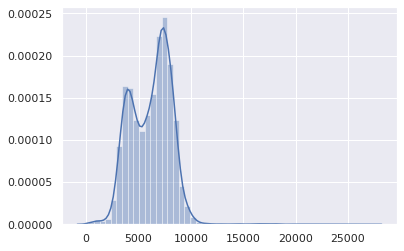

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set()
sns.distplot(sf['paper_length'])

In [0]:
sf = sf[sf['paper_length'] >1000]

Let's find the most common words that are notstop words:

In [0]:
import re
from collections import Counter
from nltk.corpus import stopwords


stop_words_set = set(stopwords.words("english"))

txt = "\n".join(sf['text'])
l = [w for w in re.findall(r"(\w+)", txt) if w not in stop_words_set]
d = Counter(l)
d.most_common(100)

[('1', 552834),
 ('0', 331422),
 ('2', 321338),
 ('x', 231135),
 ('k', 173194),
 ('p', 164124),
 ('n', 162724),
 ('3', 157086),
 ('j', 129348),
 ('4', 128999),
 ('e', 123531),
 ('5', 114118),
 ('learning', 110948),
 ('model', 108708),
 ('r', 107341),
 ('f', 103868),
 ('c', 99926),
 ('b', 99290),
 ('data', 98051),
 ('l', 86554),
 ('algorithm', 85549),
 ('6', 81874),
 ('g', 81537),
 ('w', 76194),
 ('set', 75713),
 ('h', 73990),
 ('function', 71074),
 ('using', 69881),
 ('10', 69821),
 ('v', 67956),
 ('one', 64385),
 ('8', 63954),
 ('time', 61914),
 ('z', 57769),
 ('two', 57709),
 ('7', 57150),
 ('q', 55661),
 ('problem', 54841),
 ('number', 54628),
 ('figure', 53415),
 ('models', 50385),
 ('training', 48192),
 ('also', 47873),
 ('results', 47798),
 ('u', 47398),
 ('used', 46598),
 ('neural', 46403),
 ('given', 46395),
 ('9', 46257),
 ('distribution', 46026),
 ('network', 46012),
 ('based', 45405),
 ('matrix', 43846),
 ('information', 42659),
 ('first', 41108),
 ('log', 40966),
 ('use', 4

We can see that numbers and one letter words also need to be removed. We see that plural versions of some words
are also common. Let's repeat the above process, but this time let's remove uncommon words.
We will also stem the words
using [NLTK Porter stemmer](http://www.nltk.org/howto/stem.html):

In [0]:
from nltk.stem.porter import *
from functools import lru_cache

def skip_word(w):
    if len(w) < 2 or w in stop_words_set:
        return True
    return False
stemmer = PorterStemmer()

#Using cahcing for faster performence
@lru_cache(maxsize=None)
def word_stemming(w):
    return stemmer.stem(w)

l = [word_stemming(w) for w in re.findall(r"(\w+)", txt) if not skip_word(w) ]
d = Counter(l)
d.most_common(200)

[('model', 171857),
 ('use', 171712),
 ('learn', 137237),
 ('algorithm', 122941),
 ('set', 111184),
 ('function', 105407),
 ('data', 98053),
 ('comput', 80954),
 ('network', 79615),
 ('gener', 78847),
 ('method', 76710),
 ('problem', 76242),
 ('result', 75259),
 ('time', 72357),
 ('distribut', 71098),
 ('10', 69876),
 ('one', 67999),
 ('train', 67839),
 ('optim', 67627),
 ('estim', 66952),
 ('sampl', 64352),
 ('number', 58495),
 ('two', 57726),
 ('perform', 56402),
 ('valu', 56074),
 ('figur', 55243),
 ('show', 53270),
 ('imag', 52901),
 ('paramet', 52687),
 ('differ', 52624),
 ('featur', 51870),
 ('base', 50661),
 ('bound', 50537),
 ('state', 49812),
 ('process', 47967),
 ('also', 47873),
 ('approxim', 47492),
 ('neural', 46582),
 ('given', 46435),
 ('point', 46433),
 ('inform', 45613),
 ('follow', 45068),
 ('case', 44444),
 ('approach', 44115),
 ('matrix', 43860),
 ('input', 43572),
 ('error', 43285),
 ('probabl', 42854),
 ('vector', 42592),
 ('exampl', 42484),
 ('log', 41238),
 ('fi

In [0]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
stemmer.stem("helping")



'help'

Based on the above results let's add to the stopwords words that appeared over 20,000 times:

In [0]:
stop_words_set |= {k for k,v in d.items() if v > 20000}


Let's create a bag-of-words from the text, removing stopwords:

In [0]:
def skip_word2(w):
    if len(w) <2:
        return True
    if w.isdigit():
        return True
    if w in stop_words_set or stemmer.stem(w) in stop_words_set:
        return True
    return False
    
docs = tc.text_analytics.count_words(sf['text'])
docs = docs.apply(lambda d: {w:v for w, v in d.items() if not skip_word2(w)})
docs[:2]

dtype: dict
Rows: 2
[{'land': 1.0, 'road': 1.0, 'turk': 1.0, 'buildings': 1.0, 'triendl': 1.0, 'madarasz': 1.0, 'automation': 4.0, 'conf': 3.0, 'navigation': 2.0, 'cmu': 1.0, 'stentz': 1.0, 'goto': 1.0, 'research': 1.0, 'robotics': 5.0, 'symp': 1.0, '4th': 1.0, 'vision': 2.0, 'brooks': 1.0, 'anal': 1.0, 'pattern': 1.0, 'trans': 1.0, 'wang': 1.0, 'symbol': 1.0, 'fall': 1.0, 'expert': 1.0, 'hull': 1.0, 'propagating': 1.0, 'stereo': 2.0, 'rumelhart': 1.0, 'tank': 1.0, 'hopfield': 1.0, 'references': 1.0, 'investigation': 1.0, 'abolish': 1.0, 'widen': 1.0, 'balanced': 1.0, 'implies': 1.0, 'framework': 1.0, 'universally': 1.0, 'response': 1.0, 'conclusion': 1.0, 'frame': 1.0, 'interval': 1.0, 'loosened': 1.0, 'ratio': 1.0, 'arises': 1.0, 'blem': 1.0, 'pro': 1.0, 'trajectory': 1.0, 'rejected': 1.0, 'failures': 1.0, 'recalls': 1.0, 'without': 1.0, 'periodic': 1.0, 'intell': 1.0, 'automatic': 1.0, 'plural': 1.0, 'achieved': 1.0, 'beyond': 1.0, '18m': 2.0, 'crossing': 1.0, 'within': 2.0, 'passag

Let's now use TuriCreate to create a topic model with 50 topics:

In [0]:
topic_model = tc.topic_model.create(docs, num_topics=50)

Learning a topic model

Number of documents      7225

Vocabulary size    231235

Running collapsed Gibbs sampling

+-----------+---------------+----------------+-----------------+

| Iteration | Elapsed Time  | Tokens/Second  | Est. Perplexity |

+-----------+---------------+----------------+-----------------+

| 10        | 8.71s         | 6.2118e+06     | 0               |

+-----------+---------------+----------------+-----------------+

In [0]:
topic_model.get_topics().print_rows(100)

+-------+---------------+-----------------------+
| topic |      word     |         score         |
+-------+---------------+-----------------------+
|   0   |    matrices   |  0.02367914664665435  |
|   0   |      rank     |  0.017076935728325804 |
|   0   |       ij      |  0.014746190806268183 |
|   0   |    spectral   |  0.01391915228553806  |
|   0   |   constraint  |  0.011931440386283274 |
|   1   |     visual    |  0.031433416562210784 |
|   1   |      fig      |  0.02709329273517074  |
|   1   |     signal    |  0.022091588967553425 |
|   1   |    spatial    |  0.01913839176292838  |
|   1   |   responses   |  0.013813868867679983 |
|   2   |     action    |  0.017120433554908034 |
|   2   |      game     |  0.014438171753480337 |
|   2   |     games     |  0.013783446431872001 |
|   2   |      best     |  0.013753878191541303 |
|   2   |     tensor    |  0.012410635273660974 |
|   3   |     topic     |  0.03057886891928882  |
|   3   |    density    |  0.024301367662288624 |


In [0]:
topic_model.topics

topic_probabilities,vocabulary
"[4.699082504148429e-07,3.985421328778738e-07, ...",land
"[4.699082504148429e-07,2.0325648776771563e-05, ...",road
"[4.699082504148429e-07,3.985421328778738e-07, ...",turk
"[4.699082504148429e-07,3.985421328778738e-07, ...",buildings
"[4.699082504148429e-07,3.985421328778738e-07, ...",triendl
"[4.699082504148429e-07,3.985421328778738e-07, ...",madarasz
"[6.155798080434442e-05,3.985421328778738e-07, ...",automation
"[5.168990754563272e-06,3.985421328778738e-07, ...",conf
"[4.699082504148429e-07,0.0008652349704778641, ...",navigation
"[4.699082504148429e-07,3.985421328778738e-07, ...",cmu


In [0]:
print(topic_model.topics['topic_probabilities'][0])
print(len(topic_model.topics['topic_probabilities'][0]))

array('d', [4.699082504148429e-07, 3.985421328778738e-07, 4.2240343329570046e-07, 4.224669092388757e-05, 5.518474472926857e-07, 7.416059476814203e-07, 3.3984706881977654e-05, 1.367586824668578e-06, 0.00012597242788945788, 3.2652460546909784e-05, 1.6886899987313549e-06, 8.826008481817718e-07, 2.0884612515906788e-05, 2.1479530518886402e-05, 5.425626863373537e-07, 3.0733438134256585e-07, 6.046808343398207e-07, 4.698773385215154e-07, 3.5252913212565016e-07, 1.1581647721037678e-06, 3.038483918056942e-07, 1.5061000818535386e-07, 6.530548272194191e-07, 2.8603178099013485e-07, 1.7034570809691344e-07, 2.3329682237993291e-07, 8.539600261333976e-07, 1.1048692138673472e-07, 5.576451759520241e-07, 5.184772323694271e-07, 3.027289501199725e-07, 8.387748854045894e-07, 3.1520336132783757e-07, 9.951684571432467e-07, 7.926726846878707e-06, 2.705865640232257e-07, 4.584558747688921e-07, 4.031112861993211e-06, 5.063534701677745e-07, 4.488964628629563e-05, 2.441117201691102e-07, 2.4896461839245715e-07, 3.450

In [0]:
import operator
topics_sf = topic_model.topics

def get_topic_best_match_words(topic_sf, topic_num,n):
    d = {r['vocabulary']: r['topic_probabilities'][topic_num] for r in topics_sf}
    l = sorted(d.items(), key=operator.itemgetter(1), reverse=True)
    return l[:n]
get_topic_best_match_words(topics_sf, 18,20)
    

[('control', 0.03414279897550134),
 ('markov', 0.01478894962180315),
 ('trajectory', 0.013999284365841693),
 ('transition', 0.013657331107679811),
 ('direction', 0.009941674055075459),
 ('temporal', 0.009479860891990858),
 ('continuous', 0.008362343543152547),
 ('movement', 0.008249534220872339),
 ('initial', 0.008196654851053491),
 ('change', 0.007195472115816645),
 ('trial', 0.006849993566333507),
 ('transitions', 0.006335301033430058),
 ('fixed', 0.006106157097548386),
 ('robot', 0.006056803019050794),
 ('reinforcement', 0.005520958738219807),
 ('right', 0.005499806990292268),
 ('movements', 0.005334118298193212),
 ('velocity', 0.005143752566845361),
 ('within', 0.005087347905705257),
 ('region', 0.004720717608294581)]

In [0]:
get_topic_best_match_words(topics_sf, topic_num=16,n=20)

[('submodular', 0.02562093163181254),
 ('search', 0.021315604091313015),
 ('greedy', 0.017959625460727012),
 ('parallel', 0.014246885137880512),
 ('known', 0.010382974606449059),
 ('cover', 0.010195523547803714),
 ('cut', 0.009270361871263788),
 ('maximization', 0.009052676770901453),
 ('guarantees', 0.008877319328942906),
 ('elements', 0.008538698061712606),
 ('many', 0.008405668278157846),
 ('total', 0.007468412984931123),
 ('edges', 0.007407944901497141),
 ('run', 0.006712561942006348),
 ('round', 0.006597672583481782),
 ('utility', 0.006289285357968473),
 ('property', 0.005521340698356902),
 ('monotone', 0.005237140706217186),
 ('weak', 0.005061783264258639),
 ('hard', 0.0050375960308850455)]

Let's create an additional topic model but this time using 2-grams:

In [0]:
# if we need to skip one word so skip the term
def skip_ngrams(words):
    l = words.split()
    for w in l:
        if skip_word2(w):
            return True
    return False

docs2 = tc.text_analytics.count_ngrams(sf['text'], n=2, method='word')
docs2 = docs2.apply(lambda d: {words:v for words,v in d.items() if not skip_ngrams(words)} )
topic_model = tc.topic_model.create(docs2, num_topics=100)

Learning a topic model

Number of documents      7225

Vocabulary size   1460282

Running collapsed Gibbs sampling

+-----------+---------------+----------------+-----------------+

| Iteration | Elapsed Time  | Tokens/Second  | Est. Perplexity |

+-----------+---------------+----------------+-----------------+

| 10        | 7.19s         | 4.40461e+06    | 0               |

+-----------+---------------+----------------+-----------------+

In [0]:
topic_model.get_topics().print_rows(100)

+-------+--------------------------------+------------------------+
| topic |              word              |         score          |
+-------+--------------------------------+------------------------+
|   0   |         full precision         | 0.0005953724051369653  |
|   0   |       mahalanobis metric       | 0.0005156624023894828  |
|   0   |        hash embeddings         | 0.0003317162422029848  |
|   0   |       almost submodular        |  0.000313321626184335  |
|   0   |          multi batch           | 0.00022748008476396924 |
|   1   |          weak learner          | 0.0014338848305716445  |
|   1   |         macro actions          | 0.0008665418113950255  |
|   1   |         decision rule          | 0.0008605697796142189  |
|   1   |        weak hypotheses         | 0.0005739122541355062  |
|   1   |        weak hypothesis         | 0.0005082199045466345  |
|   2   |         decision trees         | 0.0027498866208013374  |
|   2   |     differentially private     | 0.001

In [0]:
topics_sf = topic_model.topics
get_topic_best_match_words(topics_sf, 12,10)

[('pairwise comparisons', 0.0015065450947576876),
 ('causal induction', 0.0004300094590014917),
 ('commute distance', 0.00039976969395216034),
 ('rank breaking', 0.00036348197589296277),
 ('true ranking', 0.00035743402288309647),
 ('causal support', 0.00029090653977456755),
 ('call arrival', 0.0002727626807449687),
 ('gp ssm', 0.00026066677472523617),
 ('spinal cord', 0.00021833110365617232),
 ('mi mo', 0.00021228315064630604)]

We can also use [Gensim](https://radimrehurek.com/gensim/) to construct a topic model, and we can display the topics using [pyLDAvis](https://github.com/bmabey/pyLDAvis/blob/master/README.rst). Let's install the packages and use them: 


In [0]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

docs = sf['text'].apply(lambda txt: [stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)])
docs = docs.apply(lambda l: [w for w in l if not skip_word2(w)])

# Converting the data to work in Gensim
# see also https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]
print(corpus[:1])

[[(0, 1), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 1), (26, 6), (27, 2), (28, 3), (29, 1), (30, 2), (31, 2), (32, 1), (33, 1), (34, 1), (35, 2), (36, 1), (37, 1), (38, 2), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 6), (46, 2), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 2), (54, 7), (55, 1), (56, 1), (57, 3), (58, 1), (59, 1), (60, 2), (61, 1), (62, 1), (63, 15), (64, 1), (65, 3), (66, 2), (67, 4), (68, 1), (69, 5), (70, 4), (71, 3), (72, 1), (73, 4), (74, 1), (75, 3), (76, 1), (77, 3), (78, 9), (79, 1), (80, 2), (81, 6), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 3), (88, 1), (89, 1), (90, 3), (91, 11), (92, 4), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 4), (101, 1), (102, 3), (103, 1), (104, 1), (105, 1), (106, 1), (107, 1), (108, 2), (109, 1), (110, 

In [0]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=50, 
                                           update_every=0,
                                           chunksize=500,
                                           alpha='auto',
                                           per_word_topics=True)

In [0]:
import pyLDAvis
import pyLDAvis.gensim as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
42    -0.006608 -0.002152       1        1  5.808304
33    -0.003978 -0.003850       2        1  3.684193
12    -0.003872 -0.003131       3        1  3.506314
14    -0.005566  0.002456       4        1  3.189083
4     -0.005229  0.001407       5        1  3.136338
3     -0.002552 -0.006815       6        1  2.914428
31    -0.003036  0.001156       7        1  2.899939
1     -0.002967 -0.001346       8        1  2.780981
46    -0.001961 -0.004492       9        1  2.754766
44    -0.003432 -0.003828      10        1  2.719641
6     -0.002867 -0.000265      11        1  2.711059
11    -0.003105 -0.000566      12        1  2.693815
40    -0.002463  0.000727      13        1  2.684284
38    -0.003261  0.003436      14        1  2.630965
29    -0.004308 -0.000298      15        1  2.605437
15    -0.002937  0.000787      16        1  2.488156
34    -0.001875 -0.000737      17        1  2.414645
28    -0.003045  0.003296      18        1  2.353001
9     -0.002751 -0.000154      19        1  2.223020
24    -0.000412 -0.000614      20        1  2.001307
7     -0.001930  0.000819      21        1  1.995732
25    -0.002078  0.000038      22        1  1.957433
26    -0.001734  0.001353      23        1  1.916068
10    -0.003283  0.001174      24        1  1.864852
47    -0.000763  0.000509      25        1  1.850791
19     0.000541 -0.001219      26        1  1.849172
18    -0.002379  0.004170      27        1  1.825544
16    -0.003603  0.004933      28        1  1.817957
49    -0.000421  0.002213      29        1  1.794621
5     -0.001505  0.001708      30        1  1.755310
8     -0.000545  0.002539      31        1  1.658026
20    -0.000723  0.003112      32        1  1.627984
30     0.001449 -0.000325      33        1  1.622430
23     0.000364 -0.002298      34        1  1.480922
32     0.000284  0.001204      35        1  1.466622
37     0.001600 -0.000066      36        1  1.454785
21     0.001949 -0.003225      37        1  1.416261
43     0.000621 -0.002302      38        1  1.351049
41     0.000664 -0.002031      39        1  1.334630
39     0.000886 -0.000624      40        1  1.251049
17     0.001718  0.002154      41        1  1.162994
36     0.001895 -0.002154      42        1  1.154280
35     0.003841 -0.000387      43        1  1.061989
27     0.001961 -0.000404      44        1  1.029777
0      0.001530  0.007230      45        1  1.024399
13     0.002000  0.003020      46        1  0.997800
45     0.003661 -0.006391      47        1  0.959643
22     0.007121  0.000383      48        1  0.656163
2      0.009272 -0.000760      49        1  0.457294
48     0.043835  0.000610      50        1  0.004745, topic_info=            Term          Freq         Total Category  logprob  loglift
504        sourc   9627.000000   9627.000000  Default  30.0000  30.0000
568         tree  18754.000000  18754.000000  Default  29.0000  29.0000
347         mani  19306.000000  19306.000000  Default  28.0000  28.0000
403      pattern  18445.000000  18445.000000  Default  27.0000  27.0000
1471      target  14318.000000  14318.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
731          fix      0.921411  17843.466797  Topic50  -6.3843   0.0847
165      distanc      0.894560  17102.759766  Topic50  -6.4139   0.0975
190        equat      0.870173  15836.866211  Topic50  -6.4416   0.1468
676   constraint      0.899280  18763.638672  Topic50  -6.4086   0.0101
451        refer      0.875738  17422.066406  Topic50  -6.4352   0.0577

[4383 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
35908      2  0.340819     05mm
59555      4  0.086411    0h2b4
59555     16  0.086411    0h2b4
59555     18  0.086411    0h2b4
59555     28  0.086411    0h2b4
...      ...       ...      ...
29152     43  0.115786  zigmond
88090     1

## 5. Named-Entity Recognition

Using entity extraction, we can find entities, such as persons, organizations, locations, dates, events and more.
In this notebook, we demonstrate how to use [spaCy](https://spacy.io) and [Stanford NER Tagger](https://nlp.stanford.edu/software/CRF-NER.shtml#Download) using [NLTK](https://www.nltk.org) to extract entities
from text. So before we start, let's install spaCy and NLTK:
```console
!pip install spaCy
!pip install nltk
```

**Note:** Using Stanford NER Tagger is a little trickier; more details can be found in the following [post](https://pythonprogramming.net/named-entity-recognition-stanford-ner-tagger/).

Let's check if we can extract entities from text using these packages. Let's start with spaCy:

In [0]:
import spacy
from spacy import displacy

nlp = spacy.load('en')
text = """
Elon Reeve Musk FRS (born June 28, 1971) is a technology entrepreneur and engineer. 
He holds South African, Canadian, and U.S. citizenship and is the founder, CEO, and lead designer of SpaceX co-founder,
CEO, and product architect of Tesla, co-founder and CEO of Neuralink; founder of The Boring Company; 
co-founder and co-chairman of OpenAI; and co-founder of PayPal. In December 2016, 
he was ranked 21st on the Forbes list of The World's Most Powerful People.
As of October 2018, he has a net worth of $22.8 billion and is listed by Forbes as the 54th-richest person ")
"""
doc = nlp(text)
displacy.render(doc, style='ent', jupyter=True)

For better results we can use [a bigger model (789MB)](https://spacy.io/models/en#en_core_web_lg), but first we need to download it:


**Note:** We can visualize the different models parsing at the following [website](https://explosion.ai/demos/displacy-ent).

In [0]:
!python -m spacy download en_core_web_lg # Important! you need to restart runtime after install

     |████████████████████████████████| 827.9MB 80.4MB/s 
  Created wheel for en-core-web-lg: filename=en_core_web_lg-2.2.5-cp36-none-any.whl size=829180944 sha256=896e0c12b9b74261950f8e8bb22d6c9bfce0ac6c86901aec058ca883bab4ebab
  Stored in directory: /tmp/pip-ephem-wheel-cache-8504b59b/wheels/2a/c1/a6/fc7a877b1efca9bc6a089d6f506f16d3868408f9ff89f8dbfc
Successfully built en-core-web-lg
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')


In [0]:
nlp = spacy.load('en_core_web_lg')
doc = nlp(text)
displacy.render(doc, style='ent', jupyter=True)

Now let's try Stanford NER:

In [0]:
# see also https://stackoverflow.com/questions/55129698/importing-stanfordner-tagger-google-colab
!wget 'https://nlp.stanford.edu/software/stanford-ner-2018-10-16.zip'
!unzip stanford-ner-2018-10-16.zip

--2020-04-05 08:55:57--  https://nlp.stanford.edu/software/stanford-ner-2018-10-16.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180358328 (172M) [application/zip]
Saving to: ‘stanford-ner-2018-10-16.zip’

stanford-ner-2018-1 100%[===================>] 172.00M  2.52MB/s    in 63s     

2020-04-05 08:57:00 (2.74 MB/s) - ‘stanford-ner-2018-10-16.zip’ saved [180358328/180358328]

Archive:  stanford-ner-2018-10-16.zip
   creating: stanford-ner-2018-10-16/
  inflating: stanford-ner-2018-10-16/README.txt  
  inflating: stanford-ner-2018-10-16/ner-gui.bat  
  inflating: stanford-ner-2018-10-16/build.xml  
  inflating: stanford-ner-2018-10-16/stanford-ner.jar  
  inflating: stanford-ner-2018-10-16/sample-conll-file.txt  
  inflating: stanford-ner-2018-10-16/sample.ner.txt  
  inflating: stanford-ner-2018-10-16/stanford-ner-3.9.2-sources.

In [0]:
from nltk.tag import StanfordNERTagger
from nltk.tokenize import word_tokenize

st = StanfordNERTagger('./stanford-ner-2018-10-16/classifiers/english.all.3class.distsim.crf.ser.gz',
'./stanford-ner-2018-10-16/stanford-ner.jar',
encoding='utf-8')
tokenized_text = word_tokenize(text)
classified_text = st.tag(tokenized_text)

print([(w,e) for w,e in classified_text if e in {'PERSON', 'LOCATION', 'ORGANIZATION'}])

/usr/local/lib/python3.6/dist-packages/nltk/tag/stanford.py:183: DeprecationWarning: 
The StanfordTokenizer will be deprecated in version 3.2.5.
Please use nltk.tag.corenlp.CoreNLPPOSTagger or nltk.tag.corenlp.CoreNLPNERTagger instead.
  super(StanfordNERTagger, self).__init__(*args, **kwargs)


[('Elon', 'PERSON'), ('Reeve', 'PERSON'), ('Musk', 'PERSON'), ('U.S.', 'LOCATION'), ('SpaceX', 'ORGANIZATION'), ('Tesla', 'PERSON'), ('Neuralink', 'LOCATION'), ('The', 'ORGANIZATION'), ('Boring', 'ORGANIZATION'), ('Company', 'ORGANIZATION'), ('PayPal', 'ORGANIZATION'), ('Forbes', 'PERSON'), ('World', 'ORGANIZATION'), ('Forbes', 'PERSON')]


Let's use entity extraction to find the most common entities in the [Hilary Clinton's emails dataset](https://www.kaggle.com/kaggle/hillary-clinton-emails):

In [0]:
!mkdir ./datasets/hillary-clinton-emails

# download the dataset from Kaggle and unzip it
!kaggle datasets download kaggle/hillary-clinton-emails -f emails.csv  -p ./datasets/hillary-clinton-emails
!unzip ./datasets/hillary-clinton-emails/*.zip  -d ./datasets/hillary-clinton-emails/


  0% 0.00/5.80M [00:00<?, ?B/s]
100% 5.80M/5.80M [00:00<00:00, 53.8MB/s]
Archive:  ./datasets/hillary-clinton-emails/Emails.csv.zip
  inflating: ./datasets/hillary-clinton-emails/Emails.csv  


In [0]:
import pandas as pd

df = pd.read_csv("./datasets/hillary-clinton-emails/Emails.csv")
df

,Id,DocNumber,MetadataSubject,MetadataTo,MetadataFrom,SenderPersonId,MetadataDateSent,MetadataDateReleased,MetadataPdfLink,MetadataCaseNumber,MetadataDocumentClass,ExtractedSubject,ExtractedTo,ExtractedFrom,ExtractedCc,ExtractedDateSent,ExtractedCaseNumber,ExtractedDocNumber,ExtractedDateReleased,ExtractedReleaseInPartOrFull,ExtractedBodyText,RawText
0,1,C05739545,WOW,H,"Sullivan, Jacob J",87.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739545...,F-2015-04841,HRC_Email_296,FW: Wow,NaN,"Sullivan, Jacob J <Sullivan11@state.gov>",NaN,"Wednesday, September 12, 2012 10:16 AM",F-2015-04841,C05739545,05/13/2015,RELEASE IN FULL,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
1,2,C05739546,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,H,NaN,NaN,2011-03-03T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739546...,F-2015-04841,HRC_Email_296,NaN,NaN,NaN,NaN,NaN,F-2015-04841,C05739546,05/13/2015,RELEASE IN PART,"B6\nThursday, March 3, 2011 9:45 PM\nH: Latest...",UNCLASSIFIED\nU.S. Department of State\nCase N...
2,3,C05739547,CHRIS STEVENS,;H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739547...,F-2015-04841,HRC_Email_296,Re: Chris Stevens,B6,"Mills, Cheryl D <MillsCD@state.gov>","Abedin, Huma","Wednesday, September 12, 2012 11:52 AM",F-2015-04841,C05739547,05/14/2015,RELEASE IN PART,Thx,UNCLASSIFIED\nU.S. Department of State\nCase N...
3,4,C05739550,CAIRO CONDEMNATION - FINAL,H,"Mills, Cheryl D",32.0,2012-09-12T04:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH2/DOC_0C05739550...,F-2015-04841,HRC_Email_296,FVV: Cairo Condemnation - Final,NaN,"Mills, Cheryl D <MillsCD@state.gov>","Mitchell, Andrew B","Wednesday, September 12,2012 12:44 PM",F-2015-04841,C05739550,05/13/2015,RELEASE IN PART,NaN,UNCLASSIFIED\nU.S. Department of State\nCase N...
4,5,C05739554,H: LATEST: HOW SYRIA IS AIDING QADDAFI AND MOR...,"Abedin, Huma",H,80.0,2011-03-11T05:00:00+00:00,2015-05-22T04:00:00+00:00,DOCUMENTS/HRC_Email_1_296/HRCH1/DOC_0C05739554...,F-2015-04841,HRC_Email_296,NaN,NaN,NaN,NaN,NaN,F-2015-04841,C05739554,05/13/2015,RELEASE IN PART,"H <hrod17@clintonemail.com>\nFriday, March 11,...",B6\nUNCLASSIFIED\nU.S. Department of State\nCa...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7940,7941,C05778462,WYDEN,H,"Verma, Richard R",180.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,Clinton_Email_August_Release,Fw: Wyden,NaN,"Verma, Richard R <VermaRR@state.gov>",NaN,"Thursday, December 16, 2010 7:41 PM",F-2014-20439,C05778462,08/31/2015,RELEASE IN PART,NaN,UNCLASSIFIED U.S. Department of State Case No....
7941,7942,C05778463,SENATE,H,"Verma, Richard R",180.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,Clinton_Email_August_Release,Senate,NaN,"Verma, Richard R <VermaRR@state.gov>","Sullivan, Jacob J; Mills, Cheryl D; Abedin, Huma","Thursday, December 16, 2010 8:09 PM",F-2014-20439,C05778463,08/31/2015,RELEASE IN FULL,Big change of plans in the Senate. Senator Rei...,UNCLASSIFIED U.S. Department of State Case No....
7942,7943,C05778465,RICHARD (TNR),H,"Jiloty, Lauren C",116.0,2010-12-16T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,Clinton_Email_August_Release,Re: Fwd: FW: Richard (TNR),NaN,"Jiloty, Lauren C <JilotyLC@state.gov>",NaN,"Thursday, December 16, 2010 10:52 PM",F-2014-20439,C05778465,08/31/2015,RELEASE IN PART,NaN,UNCLASSIFIED U.S. Department of State Case No....
7943,7944,C05778466,FROM,H,PVerveer,143.0,2012-12-17T05:00:00+00:00,2015-08-31T04:00:00+00:00,DOCUMENTS/HRCEmail_August_Web/IPS-0113/DOC_0C0...,F-2014-20439,Clinton_Email_August_Release,NaN,"PVervee,",NaN,NaN,12/14/201,F-2014-20439,C05778466,08/31/2015,RELEASE IN PART,"PVe

Let's extract all the entities from the raw text:

In [0]:
nlp = spacy.load('en')

def get_entites_from_text(text):
    entities_dict= {}
    #using spaCy to get entities
    doc = nlp(text)
    for entity in doc.ents:
        label = entity.label_
        if  label not in entities_dict:
            entities_dict[label] = set()
        entities_dict[label].add(entity.text)        

    return entities_dict
    
    
#can take some time
df['NerDict'] = df['RawText'].apply(lambda t: get_entites_from_text(t))
df['NerDict'][0]

{'DATE': {'Wednesday, September 12,',
  'Wednesday, September 12, 2012 10:16 AM'},
 'NORP': {'Christian'},
 'ORG': {'Armed Services',
  'Doc',
  'FULL',
  'HOUSE',
  'STATE',
  'U.S. Department of State',
  'UNCLASSIFIED\n'},
 'PERSON': {'Jacob J', 'Jacob J\nSubject', 'McCain', 'Sullivan'},
 'TIME': {'10:09 AM'}}

In [0]:
count_entities_dict = {}
for d in df['NerDict']:
    for entity_type, entity_set in d.items():
        if entity_type not in count_entities_dict:
            count_entities_dict[entity_type] = {}
        for name in entity_set:
            name = name.replace("\n", " ").strip().lower()
            if name not in count_entities_dict[entity_type]:
                count_entities_dict[entity_type][name] = 0
            count_entities_dict[entity_type][name] += 1

count_entities_dict


{'CARDINAL': {'32': 20,
  'at least three': 7,
  'two': 1037,
  'one': 1334,
  'b6': 58,
  're': 70,
  '202': 642,
  'marc 3': 1,
  '11': 116,
  '3,000': 9,
  '100': 43,
  'some 2,000': 1,
  'three': 435,
  'four': 243,
  'thousands': 96,
  '37': 7,
  '4': 283,
  '5': 245,
  'approximately twenty one': 4,
  '2': 507,
  '21': 48,
  '1': 574,
  '12 12.docx': 2,
  'about 2,000': 4,
  'hundreds': 72,
  '3': 430,
  'five': 149,
  '1.3.141.4443': 1,
  'millions': 57,
  '80': 7,
  '8,4,n': 1,
  '14': 79,
  'at least fourteen': 3,
  '198': 2,
  '3:40pm': 1,
  'about 100': 5,
  '1500': 17,
  '4x4': 1,
  '25-30': 1,
  '7': 111,
  '8.25': 1,
  '26': 53,
  '400': 17,
  '0300': 2,
  '30': 48,
  '250': 11,
  'approximately 300': 2,
  '4000': 5,
  '1 09/14': 2,
  '111gmepoi': 1,
  'eight': 70,
  'about two': 3,
  'more than 80': 2,
  'million': 21,
  'dozens': 70,
  'so many millions': 2,
  'more than 5,000': 3,
  'half': 90,
  'ten': 45,
  'one third': 4,
  'at least one': 45,
  'six': 98,
  'betwee

In [0]:
count_entities_dict.keys()

dict_keys(['ORG', 'PERSON', 'DATE', 'NORP', 'TIME', 'GPE', 'CARDINAL', 'LOC', 'ORDINAL', 'FAC', 'WORK_OF_ART', 'EVENT', 'LANGUAGE', 'MONEY', 'PRODUCT', 'LAW', 'QUANTITY', 'PERCENT'])

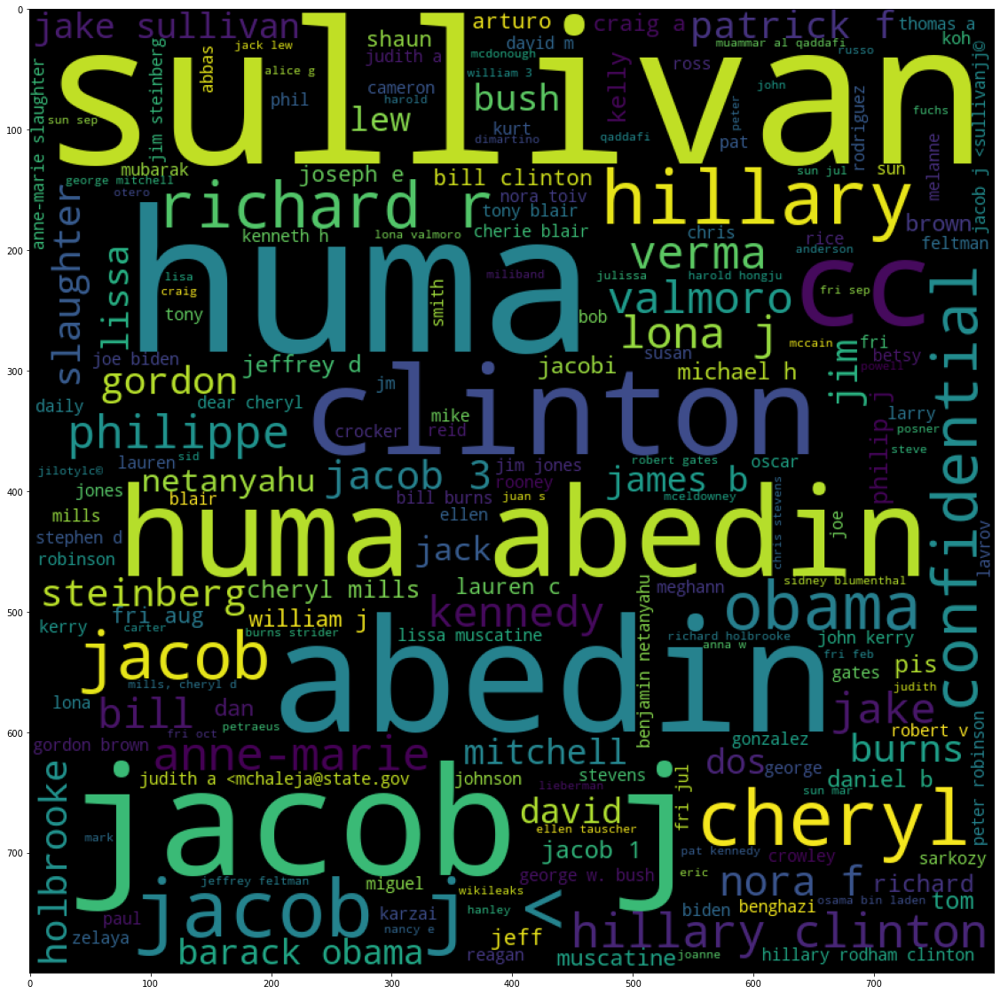

In [0]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

def draw_entities_word_cloud(entity_type, min_times=10):
    stopwords = set(STOPWORDS) | {"doc", "date","memo", "subject", 'state',
                                 }
    stopwords_parts = {"sent", "subject", "original message", "unclassified" }
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black', 
                    stopwords = stopwords, 
                    min_font_size = 10)
    def skip_entity(e):
        if e in stopwords:
            return True
        for p in stopwords_parts:
            if p in e:
                return True
        return False

    # using the subject frquencies
    d = {k:v for k,v in count_entities_dict[entity_type].items() if v > min_times and not skip_entity(k)}
    wordcloud.generate_from_frequencies(frequencies=d)
    plt.figure(figsize = (20, 20), facecolor = None) 
    plt.imshow(wordcloud)
draw_entities_word_cloud("PERSON",10)

So, from the above word cloud, we can observe the most frequent person's names that appeared in Hillary's emails.
Let's look at other entity types:

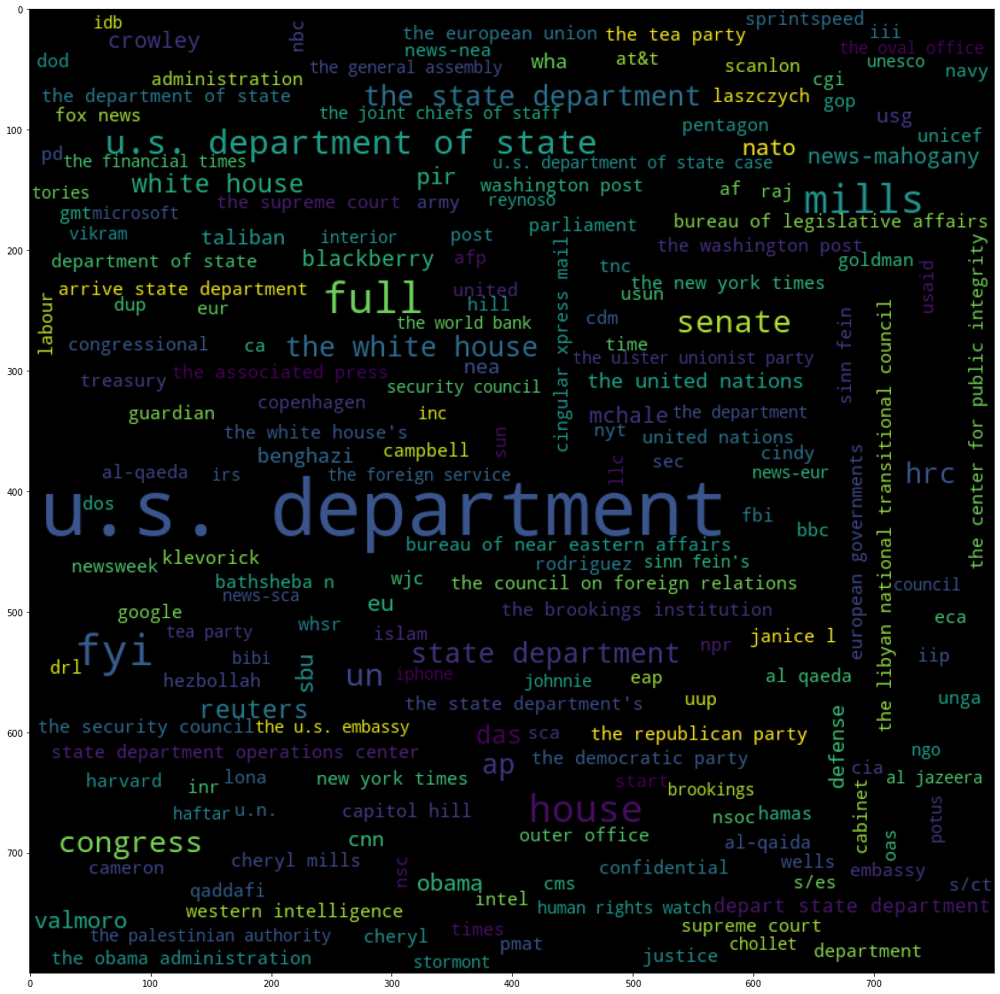

In [0]:
draw_entities_word_cloud("ORG",5)

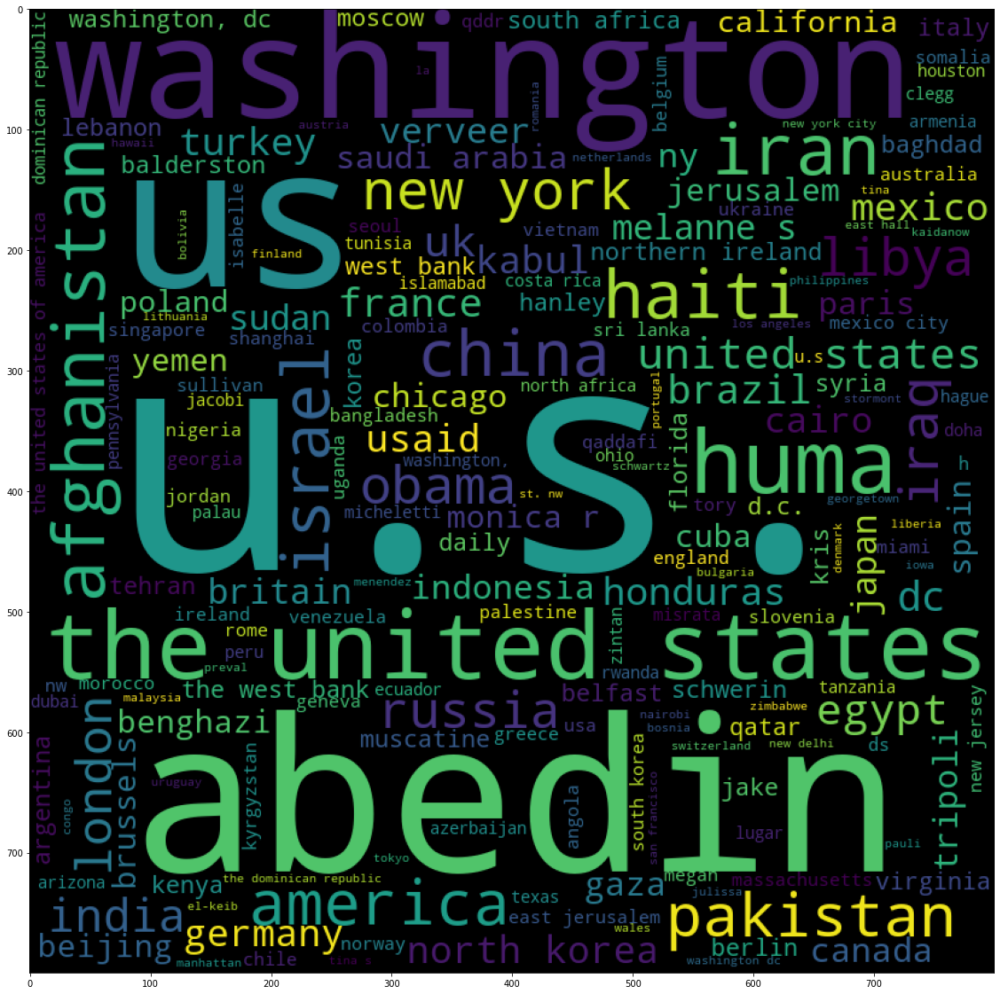

In [0]:
draw_entities_word_cloud("GPE",5)

From the above, in only a few lines of code, we can learn a lot about influential people and locations according to emails.
For instance, we can see the places and locations that are mentioned the highest number of times in her emails. 

We can use information-retrieval  algorithms to find the most relevant documents in a specific subject:

In [0]:
import turicreate as tc
sf = tc.SFrame(df[['RawText']])
sf['RawText'] = sf['RawText'].apply(lambda t: t.lower())
scores = tc.text_analytics.bm25(sf['RawText'], [ "abedin", "huma"])
scores

doc_id,bm25
2,0.724095031462113
4,1.3713111744281243
7,1.3720560917314377
13,0.0
29,0.5346519231055187
36,0.4845223893370311
38,0.3133226676349629
51,0.7582913315479104
60,0.0
65,4.925457352367367


In [0]:
print(sf[65]['RawText'])

unclassified
u.s. department of state
case no. f-2015-04841
doc no. c05739638
date: 05/13/2015
state dept. - produced to house select benghazi comm.
subject to agreement on sensitive information & redactions. no foia waiver.
release in
part b5, b6
from: h <hrod17@clintonemailcom>
sent saturday, april 2, 2011 11:59 am
to: 'sullivanjj@state.gov'
subject re: brits and libya
when is chris stevens going?
---, original message --
from: sullivan, jacob j [mailto:sullivan11@state.gov)
sent: saturday, april 02, 2011 1034 am
to: h
cc: huma abedin
subject: re: brits and libya
will raise.
b5
--- original message ---
from: h [mailto:h0r22@clintonemail.com]
sent: saturday, april 02, 2011 10:23 am
to: suliivan, jacob
cc: huma abedin <hurna@clintonemaii.com>
subject: re: brits and libya
but, how does hbj go w the amir in dc?
b5
----- original message
from sullivan, jacob [mailto:sullivanii@state.gov]
sent: saturday, april 02, 2011 10:19 am
to: h
cc: huma abedin
subject: re: brits and libya
you're not 

In [0]:
scores = tc.text_analytics.bm25(sf['RawText'], [   "presidential", "campaign"]).sort('bm25', ascending=False)
scores

doc_id,bm25
1668,9.268372998095261
1934,8.749499737279919
125,8.748472668402602
131,8.652749870824792
132,8.56455184839449
2116,8.564381767946506
136,8.459461688072613
1983,7.825249588982583
4298,7.482200794526158
1640,6.952700122565822


In [0]:
print(sf[1934]['RawText'])

unclassified u.s. department of state case no. f-2014-20439 doc no. c05762498 date: 06/30/2015
release in full
from: mills, cheryl d <millscd@state.gov>
sent: tuesday, june 23, 2009 5:13 pm
to:
cc: abedin, huma
subject: see below - then see next email
longtime clinton confidant blumenthal to become clinton advisor
tue, 06/23/2009 - 1:00pm
longtime journalist and former clinton white house advisor sidney blumenthal will become a special advisor
without portfolio to secretary of state hillary clinton, the cable has learned. blumenthal refused to comment.
but sources say he is filling out the paperwork and disentangling himself from other obligations as he moves to
become a special advisor to the secretary whose presidential campaign he helped advise. the position would
not require senate confirmation.
clinton, who is recovering from surgery to repair a broken elbow, has been building her team at the state
department, while establishing her credentials as a team player supporting and ampl

## 6. Sentiment Analysis

### 6.1 Coursera's Course Reviews Dataset

In this section, we are going to construct a sentiment classifier using various datasets. 
Let's first download the [100K Coursera's Course Reviews Dataset](https://www.kaggle.com/septa97/100k-courseras-course-reviews-dataset), and load it into an SFrame object:
    

In [0]:
!mkdir ./datasets
!mkdir ./datasets/100k-courseras-course-reviews-dataset

# download the dataset from Kaggle and unzip it
!kaggle datasets download septa97/100k-courseras-course-reviews-dataset -f reviews.csv  -p ./datasets/100k-courseras-course-reviews-dataset
!unzip ./datasets/100k-courseras-course-reviews-dataset/*.zip  -d ./datasets/100k-courseras-course-reviews-dataset/

  0% 0.00/5.50M [00:00<?, ?B/s]
100% 5.50M/5.50M [00:00<00:00, 91.1MB/s]
Archive:  ./datasets/100k-courseras-course-reviews-dataset/reviews.csv.zip
  inflating: ./datasets/100k-courseras-course-reviews-dataset/reviews.csv  


In [0]:
import turicreate as tc
sf = tc.SFrame.read_csv("./datasets/100k-courseras-course-reviews-dataset/reviews.csv")
sf

Finished parsing file /content/datasets/100k-courseras-course-reviews-dataset/reviews.csv

Parsing completed. Parsed 100 lines in 0.288174 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/datasets/100k-courseras-course-reviews-dataset/reviews.csv

Parsing completed. Parsed 107018 lines in 0.277009 secs.

Id,Review,Label
0,good and interesting,5
1,This class is veryhelpful to me. Curren ...,5
2,like!Prof and TAs arehelpful and the ...,5
3,Easy to follow andincludes a lot basic and ...,5
4,Really nice teacher!Icould got the point ...,4
5,"Great course - Irecommend it for all, ...",5
6,One of the most usefulcourse on IT Management! ...,5
7,I was disappointedbecause the name is ...,3
8,Super content. I'lldefinitely re-do the ...,5
9,One of the excellentcourses at Coursera for ...,5


Let visualize the distributions of the ratings:

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


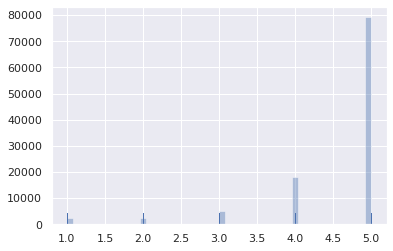

In [0]:
import seaborn as sns
sns.set()
sns.distplot(sf['Label'], kde=False, rug=True)

In [0]:
sf.groupby('Label', tc.aggregate.COUNT()).sort("Count", ascending=False)

Label,Count
5,79173
4,18054
3,5071
1,2469
2,2251


We can see that vast number of reviews contain positive  sentiments. 
Let's define reviews with a score of 4 & 5 as positive  sentiment reviews and reviews
with a score of 1 & 2 as negative sentiment reviews:

In [0]:
sf = sf[sf['Label'] != 3]
def label2sentiment(label):
    if label >= 4:
        return "Positive"
    else:
        return "Negative"

sf['sentiment'] = sf['Label'].apply(lambda label: label2sentiment(label))
sf

Id,Review,Label,sentiment
0,good and interesting,5,Positive
1,This class is veryhelpful to me. Curren ...,5,Positive
2,like!Prof and TAs arehelpful and the ...,5,Positive
3,Easy to follow andincludes a lot basic and ...,5,Positive
4,Really nice teacher!Icould got the point ...,4,Positive
5,"Great course - Irecommend it for all, ...",5,Positive
6,One of the most usefulcourse on IT Management! ...,5,Positive
8,Super content. I'lldefinitely re-do the ...,5,Positive
9,One of the excellentcourses at Coursera for ...,5,Positive
10,Is there any reason whyyou should not apply the ...,5,Positive


Let's extract n-grams features and construct a sentiment classifier:

In [0]:
sf['words_1grams'] = tc.text_analytics.count_ngrams(sf['Review'], n=1, method='word')
sf['words_2grams'] = tc.text_analytics.count_ngrams(sf['Review'], n=2, method='word')
sf

Id,Review,Label,sentiment,words_1grams,words_2grams
0,good and interesting,5,Positive,"{'interesting': 1, 'and':1, 'good': 1} ...","{'and interesting': 1,'good and': 1} ..."
1,This class is veryhelpful to me. Curren ...,5,Positive,"{'knowledge': 1, 'basic':1, 'lot': 1, 'a': 1, ...","{'music knowledge': 1,'basic music': 1, 'of ..."
2,like!Prof and TAs arehelpful and the ...,5,Positive,"{'experience': 1,'rewarding': 1, 'very': ...","{'learning experience':1, 'quite active': 1, ..."
3,Easy to follow andincludes a lot basic and ...,5,Positive,"{'sketchup': 1, 'use': 1,'easy': 1, 'and': 2, ...","{'use sketchup': 1,'techniques to': 1, 'to ..."
4,Really nice teacher!Icould got the point ...,4,Positive,"{'really': 1, 'teacher':1, 'i': 1, 'nice': 1, ...","{'really nice': 1, 'niceteacher': 1, 'teacher ..."
5,"Great course - Irecommend it for all, ...",5,Positive,"{'course': 1,'recommend': 1, 'i': 1, ...","{'business managers': 1,'great course': 1, ..."
6,One of the most usefulcourse on IT Management! ...,5,Positive,"{'management': 1, 'it':1, 'on': 1, 'course': 1, ...","{'it management': 1, 'onit': 1, 'course on': 1, ..."
8,Super content. I'lldefinitely re-do the ...,5,Positive,"{'course': 1, 're': 1,'the': 1, 'do': 1, ...","{'the course': 1, 'redo': 1, 'definitely re': ..."
9,One of the excellentcourses at Coursera for ...,5,Positive,"{'managers': 1, 'and': 1,'bosses': 1, 'one': 1, ...","{'and managers': 1, 'oneof': 1, 'for ..."
10,Is there any reason whyyou should not apply the ...,5,Positive,"{'oleg': 1, 'regards': 1,'best': 1, 'aspects': 1, ...","{'oleg serov': 1,'regards oleg': 1, 'all ..."


In [0]:
train, test = sf.random_split(0.8)
cls = tc.classifier.create(train,features=['words_1grams', 'words_2grams'], target="sentiment")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: LogisticClassifier, SVMClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Logistic regression:

--------------------------------------------------------

Number of examples          : 77548

Number of classes           : 2

Number of feature columns   : 2

Number of unpacked features : 387223

Number of coefficients      : 387224

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 3        | 0.500000  | 1.611911     | 0.954725          | 0.956149            |

| 1         | 6        | 2.500000  | 2.219945     | 0.994558          | 0.965213            |

| 2         | 7        | 2.500000  | 2.517268     | 0.997576          | 0.967173            |

| 3         | 8        | 2.500000  | 2.809312     | 0.998762          | 0.969623            |

| 4         | 9        | 2.500000  | 3.102795     | 0.999342          | 0.973542            |

| 6         | 11       | 2.500000  | 3.660109     | 0.999239          | 0.971583            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

SVM:

--------------------------------------------------------

Number of examples          : 77548

Number of classes           : 2

Number of feature columns   : 2

Number of unpacked features : 387223

Number of coefficients    : 387224

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.434165     | 0.954725          | 0.956149            |

| 1         | 5        | 5.000000  | 0.986069     | 0.994971          | 0.971828            |

| 2         | 7        | 4.516757  | 1.409680     | 0.998633          | 0.969623            |

| 3         | 9        | 1.885815  | 1.828133     | 0.999007          | 0.968643            |

| 4         | 10       | 1.885815  | 2.101652     | 0.999304          | 0.968398            |

| 9         | 16       | 1.073531  | 3.643262     | 0.999678          | 0.968398            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: LogisticClassifier              : 0.9715825575698187
PROGRESS: SVMClassifier                   : 0.9683978441940225
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


In [0]:
cls.evaluate(test)

{'accuracy': 0.9705665206477334,
 'auc': 0.9369143153016826,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Positive   |     Negative    |  203  |
 |   Negative   |     Positive    |  395  |
 |   Negative   |     Negative    |  601  |
 |   Positive   |     Positive    | 19118 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.9846011227275069,
 'log_loss': 0.13698542736158584,
 'precision': 0.979757085020243,
 'recall': 0.9894932974483722,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+--------------------+--------------------+-------+-----+
 | threshold |        fpr         |        tpr         |   p   |  n  |
 +-----------+--------------------+--------------------+-------+-----+
 |    0.0  

Let's try to improve our classifier a little more. First let's lower case the strings and remove stopwords from the
1-grams:

In [0]:
train['words_1grams'] = train['words_1grams'].dict_trim_by_keys(tc.text_analytics.stop_words(), True)
test['words_1grams'] = test['words_1grams'].dict_trim_by_keys(tc.text_analytics.stop_words(), True)

We can also use other Python packages that use a wordlist-based approach for sentiment analysis. 
For each review, let's add a score column using the 
[Afinn package](https://github.com/fnielsen/afinn):


In [0]:
from afinn import Afinn
afinn = Afinn()

train['afinn_score'] = train['Review'].apply(lambda t: afinn.score(t))
test['afinn_score'] = test['Review'].apply(lambda t: afinn.score(t))
train

Id,Review,Label,sentiment,words_1grams,words_2grams
0,good and interesting,5,Positive,"{'interesting': 1,'good': 1} ...","{'and interesting': 1,'good and': 1} ..."
1,This class is veryhelpful to me. Curren ...,5,Positive,"{'knowledge': 1, 'basic':1, 'lot': 1, 'makes': 1, ...","{'music knowledge': 1,'basic music': 1, 'of ..."
2,like!Prof and TAs arehelpful and the ...,5,Positive,"{'experience': 1,'rewarding': 1, ...","{'learning experience':1, 'quite active': 1, ..."
3,Easy to follow andincludes a lot basic and ...,5,Positive,"{'sketchup': 1, 'easy':1, 'follow': 1, 'lot' ...","{'use sketchup': 1,'techniques to': 1, 'to ..."
5,"Great course - Irecommend it for all, ...",5,Positive,"{'recommend': 1,'managers': 1, 'great': ...","{'business managers': 1,'great course': 1, ..."
8,Super content. I'lldefinitely re-do the ...,5,Positive,"{'ll': 1, 'content': 1,'super': 1} ...","{'the course': 1, 'redo': 1, 'definitely re': ..."
9,One of the excellentcourses at Coursera for ...,5,Positive,"{'managers': 1, 'bosses':1, 'courses': 1, ...","{'and managers': 1, 'oneof': 1, 'for ..."
12,This is a good course foran CIO in a non techn ...,5,Positive,"{'company': 1,'technical': 1, 'good': ...","{'technical company': 1,'this is': 1, 'is a': 1, ..."
14,Very structured approach.Thank you for sharing ...,5,Positive,"{'sharing': 1,'approach': 1, ...","{'sharing with': 1, 'forsharing': 1, 'you for': ..."
15,Program demystifies theevolving world of CIO ...,4,Positive,"{'review': 1, 'requires':1, 'subtitle': 1, ...","{'requires audit': 1,'french with': 1, 'audit ..."


Let's check if our classifier indeed improved:

In [0]:
#Please notice that this train/test set are different from the above train and test sets
cls = tc.boosted_trees_classifier.create(train,features=['afinn_score', 'words_1grams', 'words_2grams'], target="sentiment")



PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 77548

Number of classes           : 2

Number of feature columns   : 3

Number of unpacked features : 385792

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.449592     | 0.963661          | 0.959334            | 0.469241          | 0.470667            |

| 2         | 0.895931     | 0.963984          | 0.959334            | 0.346156          | 0.348743            |

| 3         | 1.335691     | 0.964164          | 0.960804            | 0.269663          | 0.272525            |

| 4         | 1.765739     | 0.964551          | 0.960314            | 0.219242          | 0.223302            |

| 5         | 2.202287     | 0.964848          | 0.959824            | 0.184827          | 0.189720            |

| 10        | 4.425564     | 0.966653          | 0.961293            | 0.114863          | 0.124616            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls.evaluate(test)

{'accuracy': 0.9604764482945317,
 'auc': 0.9136771453081096,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Negative   |     Negative    |  268  |
 |   Positive   |     Negative    |   75  |
 |   Negative   |     Positive    |  728  |
 |   Positive   |     Positive    | 19246 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.97956483013106,
 'log_loss': 0.12902776742665276,
 'precision': 0.9635526184039251,
 'recall': 0.9961182133429947,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+-------+-----+
 | threshold | fpr | tpr |   p   |  n  |
 +-----------+-----+-----+-------+-----+
 |    0.0    | 1.0 | 1.0 | 19321 | 996 |
 |   1e-05   | 1.0 | 1.0 | 19321 | 996 |
 |   2e-05   | 1.0 |

### 6.2 Google, Amazon and more Employee Reviews Dataset

For this example, we will use the [Google, Amazon and more Employee Reviews dataset](http://web.archive.org/web/20190503070023/https://www.kaggle.com/petersunga/google-amazon-facebook-employee-reviews).

Let's load the dataset into an SFrame object:

In [0]:
import textblob
import pandas as pd
import turicreate as tc

sf = tc.SFrame.read_csv("./datasets/employee_reviews.csv", na_values=['none'])
sf

Finished parsing file /content/datasets/employee_reviews.csv

Parsing completed. Parsed 100 lines in 0.789567 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,str,str,str,str,str,str,str,float,float,float,float,float,float,int,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/datasets/employee_reviews.csv

Parsing completed. Parsed 67529 lines in 0.699725 secs.

X1,company,location,dates,job-title,summary
1,google,None,"Dec 11, 2018",Current Employee -Anonymous Employee ...,Best Company to work for
2,google,"Mountain View, CA","Jun 21, 2013",Former Employee - ProgramManager ...,"Moving at the speed oflight, burn out is ..."
3,google,"New York, NY","May 10, 2014",Current Employee -Software Engineer III ...,Great balance betweenbig-company security and ...
4,google,"Mountain View, CA","Feb 8, 2015",Current Employee -Anonymous Employee ...,The best place I'veworked and also the most ...
5,google,"Los Angeles, CA","Jul 19, 2018",Former Employee -Software Engineer ...,"Unique, one of a kinddream job ..."
6,google,"Mountain View, CA","Dec 9, 2018",Former Employee - SDE2,NICE working in GOOGLE asan INTERN ...
7,google,"New York, NY","Dec 11, 2018",Current Employee -Software Engineer ...,Software engineer
8,google,None,"Dec 11, 2018",Former Employee -Anonymous Employee ...,great place to work andprogress ...
9,google,"New York, NY","Dec 10, 2018",Current Employee -Anonymous Employee ...,Google SurpassesRealistic Expectations ...
10,google,None,"Dec 9, 2018",Current Employee -Anonymous Employee ...,Execellent for engineers


Let's use Seaborn to visualize the score distribution in the various categories:

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


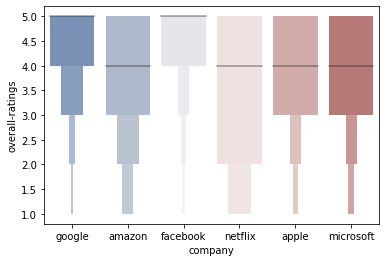

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
df = sf.to_dataframe()

sns.boxenplot(x="company", y="overall-ratings", data=df, palette="vlag")


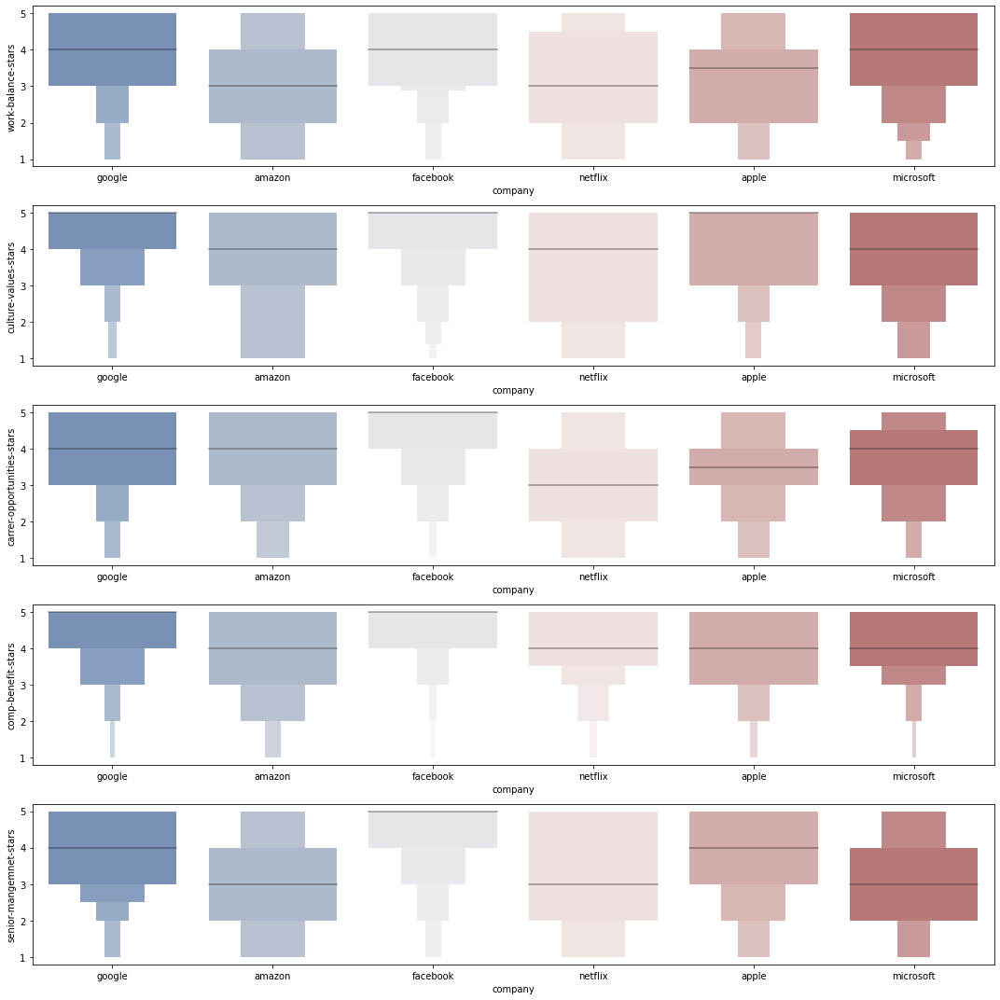

In [0]:
col_names = [c for c in df.columns.values if "-stars" in c]

fig, ax =plt.subplots(len(col_names),1, figsize=(15,15))
for i in range(len(col_names)):
    c = col_names[i]
    df2 = df[['company', c]]
    df2 = df2.dropna()
    sns.boxenplot(x="company", y=c, data=df2, palette="vlag", ax=ax[i])
plt.tight_layout()

Using the review's dataset, we can construct a classifier that can predict a review's score in different categories.
Moreover, the pros/cons columns can assist us in building a sentiment general classifier, which can predict the sentiment on
other datasets. Let's start by calculating  the bag-of-words and 2-grams of the pros and cons columns:

In [0]:
sf = sf.remove_columns(["X1", "location", "dates", "job-title", "summary", "advice-to-mgmt", "link",
                       "helpful-count"])
sf['pros_words_1grams'] = tc.text_analytics.count_ngrams(sf['pros'], n=1, method='word')
sf['pros_words_2grams'] = tc.text_analytics.count_ngrams(sf['pros'], n=2, method='word')
sf['pros_words_1grams'] = sf['pros_words_1grams'].dict_trim_by_keys(tc.text_analytics.stop_words(), True)

sf['cons_words_1grams'] = tc.text_analytics.count_ngrams(sf['cons'], n=1, method='word')
sf['cons_words_2grams'] = tc.text_analytics.count_ngrams(sf['cons'], n=2, method='word')
sf['cons_words_1grams'] = sf['cons_words_1grams'].dict_trim_by_keys(tc.text_analytics.stop_words(), True)

sf.materialize()
sf

company,pros,cons,overall-ratings,work-balance-stars,culture-values-stars
google,People are smart andfriendly ...,Bureaucracy is slowingthings down ...,5.0,4.0,5.0
google,"1) Food, food, food. 15+cafes on main campus ...",1) Work/life balance.What balance? All those ...,4.0,2.0,3.0
google,"* If you're a softwareengineer, you're among ...","* It *is* becominglarger, and with it c ...",5.0,5.0,4.0
google,You can't find a morewell-regarded company ...,I live in SF so thecommute can take between ...,5.0,2.0,5.0
google,Google is a world of itsown. At every other ...,"If you don't work in MTV(HQ), you will be given ...",5.0,5.0,5.0
google,"People are not that busy,so they are nice to help ...",Food is not good as Iexpected. People said it ...,5.0,4.0,4.0
google,Great workingenvironment. Good work ...,Usual big companyproblems. Hierarchy. ...,5.0,5.0,4.0
google,"work culture, benefits,growth, people, ...",No cons that i can thinkof ...,5.0,5.0,5.0
google,Great products. Visionyou can feel good about. ...,Younger employeescomplaining about the ...,5.0,5.0,5.0
google,Impact driven. Best techin the world. ...,Size matters. Engineersare a bit disconnected ...,5.0,5.0,5.0


In [0]:
sf2 = sf['company', 'pros_words_1grams', 'pros_words_2grams', 'cons_words_1grams', 'cons_words_2grams',"senior-mangemnet-stars"]
sf2 = sf2.dropna()         
train,test = sf2.random_split(0.8)
reg = tc.random_forest_regression.create(train,features=['company', 'pros_words_1grams', 'pros_words_2grams', 'cons_words_1grams', 'cons_words_2grams'], target="senior-mangemnet-stars", max_iterations=100)

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Random forest regression:

--------------------------------------------------------

Number of examples          : 45278

Number of features          : 5

Number of unpacked features : 647235

+-----------+--------------+--------------------+----------------------+---------------------------------+-----------------------------------+

| Iteration | Elapsed Time | Training Max Error | Validation Max Error | Training Root-Mean-Square Error | Validation Root-Mean-Square Error |

+-----------+--------------+--------------------+----------------------+---------------------------------+-----------------------------------+

| 1         | 0.616370     | 4.083333           | 3.705882             | 1.238076                        | 1.250653                          |

| 2         | 1.145891     | 3.380154           | 3.380154             | 1.195679                        | 1.196412                          |

| 3         | 1.672002     | 3.378884           | 3.378884             | 1.187541                        | 1.187240                          |

| 4         | 2.204252     | 3.421325           | 3.382498             | 1.183349                        | 1.183923                          |

| 5         | 2.735609     | 3.391403           | 3.391403             | 1.180377                        | 1.179564                          |

| 10        | 5.319997     | 3.398396           | 3.398396             | 1.178478                        | 1.177195                          |

| 20        | 10.491314    | 3.309789           | 3.195827             | 1.175052                        | 1.175264                          |

| 30        | 15.612609    | 3.281525           | 3.177994             | 1.174273                        | 1.173335                          |

| 40        | 20.765008    | 3.239434           | 3.154543             | 1.174212                        | 1.173823                          |

| 50        | 25.886004    | 3.246720           | 3.152441             | 1.174280                        | 1.174747                          |

| 60        | 31.010362    | 3.207076           | 3.154958             | 1.174039                        | 1.174404                          |

| 70        | 36.183317    | 3.195446           | 3.151263             | 1.174170                        | 1.173950                          |

| 80        | 41.336456    | 3.172414           | 3.164150             | 1.174200                        | 1.173946                          |

| 90        | 46.438745    | 3.192970           | 3.185625             | 1.174440                        | 1.174204                          |

| 100       | 51.573240    | 3.200479           | 3.193868             | 1.174480                        | 1.173778                          |

+-----------+--------------+--------------------+----------------------+---------------------------------+-----------------------------------+

In [0]:
reg.evaluate(test)

{'max_error': 3.234947681427002, 'rmse': 1.1832002266247181}

In [0]:
test['predict-senior-mangemnet-stars'] = reg.predict(test)

In [0]:
test["predict-senior-mangemnet-stars", 'senior-mangemnet-stars'].print_rows(20)

+--------------------------------+------------------------+
| predict-senior-mangemnet-stars | senior-mangemnet-stars |
+--------------------------------+------------------------+
|       3.8564248085021973       |          4.0           |
|       3.372650146484375        |          5.0           |
|       3.8564248085021973       |          4.0           |
|       3.8564248085021973       |          3.0           |
|       3.8564248085021973       |          4.0           |
|       3.8564248085021973       |          5.0           |
|       3.850492238998413        |          5.0           |
|       3.850492238998413        |          5.0           |
|       3.8564248085021973       |          3.0           |
|       3.850492238998413        |          5.0           |
|       3.8564248085021973       |          2.0           |
|       3.850492238998413        |          3.0           |
|       3.8564248085021973       |          3.0           |
|       3.850492238998413        |      

### 6.3 Hotel Review Dataset

Let's use the data from this dataset to evaluate the sentiment on the [Hotel Review dataset](https://www.kaggle.com/anu0012/hotel-review):

In [0]:
!mkdir ./datasets/hotel-review

# download the dataset from Kaggle and unzip it
!kaggle datasets download anu0012/hotel-review -p ./datasets/hotel-review
!unzip ./datasets/hotel-review/*.zip  -d ./datasets/hotel-review/

 46% 10.0M/21.7M [00:00<00:00, 41.8MB/s]
100% 21.7M/21.7M [00:00<00:00, 72.5MB/s]
Archive:  ./datasets/hotel-review/hotel-review.zip
  inflating: ./datasets/hotel-review/test.csv  
  inflating: ./datasets/hotel-review/train.csv  


In [0]:
h_sf = tc.SFrame.read_csv("./datasets/hotel-review/train.csv")
h_sf['words_1grams'] = tc.text_analytics.count_ngrams(h_sf['Description'], n=1, method='word')
h_sf['words_1grams'] = h_sf['words_1grams'].dict_trim_by_keys(tc.text_analytics.stop_words(lang='en'), exclude=True)
h_sf['words_2grams'] = tc.text_analytics.count_ngrams(h_sf['Description'], n=2, method='word')
h_sf = h_sf.rename({"Is_Response": 'sentiment'})
h_sf = h_sf[h_sf['sentiment'].apply(lambda s: s=='happy' or s=='not happy')]
h_sf.materialize()
h_sf

Finished parsing file /content/datasets/hotel-review/train.csv

Parsing completed. Parsed 100 lines in 0.618113 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/datasets/hotel-review/train.csv

Parsing completed. Parsed 38932 lines in 0.598576 secs.

User_ID,Description,Browser_Used,Device_Used,sentiment,words_1grams
id10326,The room was kind ofclean but had a VERY ...,Edge,Mobile,not happy,"{'breakfast': 1, 'price':1, 'staying': 1, 'fus ..."
id10327,I stayed at the CrownPlaza April -- - April ...,Internet Explorer,Mobile,not happy,"{'vacation': 1,'business': 1, 'stay' ..."
id10328,I booked this hotelthrough Hotwire at the ...,Mozilla,Tablet,not happy,"{'station': 2,'mcpherson': 1, 'view': ..."
id10329,Stayed here with husbandand sons on the way t ...,InternetExplorer,Desktop,happy,"{'beds': 1, 'heavenly':2, 'forgot': 1, 'walk': ..."
id10330,My girlfriends and Istayed here to celebrate ...,Edge,Tablet,not happy,"{'recommend': 1,'seaons': 1, 'stay': 1, ..."
id10331,We had - rooms. One wasvery nice and clearly ...,InternetExplorer,Desktop,happy,"{'stay': 1, 'vacation':1, 'good': 1, 'floors': ..."
id10332,My husband and I havestayed in this hotel a ...,Firefox,Tablet,not happy,"{'stay': 1, 'breakfast':1, 'internet': 1, ..."
id10333,My wife & I stayed inthis glorious city a ...,Google Chrome,Mobile,happy,"{'charm': 1, 'helpful':2, 'day': 1, 'small': 1, ..."
id10334,My boyfriend and I stayedat the Fairmont on a ...,Internet Explorer,Desktop,happy,"{'bowl': 1, 'strong': 1,'scorpion': 1, ..."
id10335,"Wonderful staff, greatlocation, but it was ...",Chrome,Tablet,not happy,"{'shampoo': 1, 'line': 1,'ginger': 1, 'white': 1, ..."


In [0]:
train_sf1 = sf['pros_words_1grams','pros_words_2grams']
train_sf1['sentiment'] = "happy"
train_sf1 = train_sf1.rename({'pros_words_1grams': 'words_1grams', 'pros_words_2grams':'words_2grams'})
train_sf2 = sf['cons_words_1grams','cons_words_2grams']
train_sf2['sentiment'] = "not happy"
train_sf2 = train_sf2.rename({'cons_words_1grams': 'words_1grams', 'cons_words_2grams':'words_2grams'})

train_sf = train_sf1.append(train_sf2)
train_sf = train_sf.dropna()
train_sf

words_1grams,words_2grams,sentiment
"{'friendly': 1, 'smart':1, 'people': 1} ...","{'and friendly': 1,'smart and': 1, 'are ...",happy
"{'con': 1, 'industry': 1,'diligent': 1, 'worki ...","{'to that': 1, 'con to':1, 'a con': 1, 'industry ...",happy
"{'expect': 1, 'hard': 1,'isn': 1, 'ways': 1, ...","{'expect to': 1, 'dayand': 1, 'to code': 1, ...",happy
"{'desk': 1, 'lot': 1,'micromanager': 1, ...","{'your desk': 1, 'toyour': 1, 'it chained': ...",happy
"{'refreshing': 1,'systematic': 1, ...","{'very refreshing': 1,'is very': 1, 'process ...",happy
"{'learn': 1, 'time': 1,'busy': 1, 'finish': 1, ...","{'learn something': 1,'time and': 1, 'it in': ...",happy
"{'life': 1, 'work': 1,'balance': 1, 'good': 1, ...","{'work life': 1, 'lifebalance': 1, 'good wo ...",happy
"{'people': 1, 'growth':1, 'benefits': 1, ...","{'growth people': 1,'benefits growth': 1, ...",happy
"{'typically': 1,'automonomy': 1, ...","{'from an': 1, 'wantfrom': 1, 'you want': 1, ...",happy
"{'world': 1, 'tech': 1,'driven': 1, 'impact' ...","{'the world': 1, 'inthe': 1, 'tech in': 1, ...",happy


In [0]:
train_sf = train_sf['words_1grams','words_2grams', 'sentiment']
cls = tc.classifier.create(train_sf,features=['words_1grams','words_2grams'], target="sentiment")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: LogisticClassifier, SVMClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Logistic regression:

--------------------------------------------------------

Number of examples          : 128304

Number of classes           : 2

Number of feature columns   : 2

Number of unpacked features : 662999

Number of coefficients      : 663000

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 3        | 0.500000  | 0.998724     | 0.962565          | 0.901525            |

| 1         | 5        | 0.500000  | 1.698383     | 0.979876          | 0.920480            |

| 2         | 6        | 0.625000  | 2.124447     | 0.985503          | 0.927143            |

| 3         | 8        | 0.625000  | 2.796533     | 0.991193          | 0.935436            |

| 4         | 9        | 0.781250  | 3.243171     | 0.994544          | 0.938102            |

| 9         | 15       | 0.984879  | 5.701618     | 0.998254          | 0.932919            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

SVM:

--------------------------------------------------------

Number of examples          : 128304

Number of classes           : 2

Number of feature columns   : 2

Number of unpacked features : 662999

Number of coefficients    : 663000

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.706864     | 0.962565          | 0.901525            |

| 1         | 4        | 1.000000  | 1.325737     | 0.982378          | 0.914705            |

| 2         | 5        | 1.000000  | 1.710599     | 0.988434          | 0.920776            |

| 3         | 6        | 1.000000  | 2.108027     | 0.992424          | 0.924626            |

| 4         | 7        | 1.000000  | 2.498004     | 0.994918          | 0.926699            |

| 9         | 12       | 1.000000  | 4.546459     | 0.998052          | 0.925515            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: LogisticClassifier              : 0.9329187027987561
PROGRESS: SVMClassifier                   : 0.9255145861098771
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


In [0]:
cls.evaluate(h_sf)

{'accuracy': 0.6902291174355286,
 'auc': 0.7714635986968648,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |    happy     |    not happy    | 10266 |
 |    happy     |      happy      | 16255 |
 |  not happy   |    not happy    | 10617 |
 |  not happy   |      happy      |  1794 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.6377725716345287,
 'log_loss': 3.047497033249668,
 'precision': 0.508403964947565,
 'recall': 0.8554508097655306,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+--------------------+--------------------+-------+-------+
 | threshold |        fpr         |        tpr         |   p   |   n   |
 +-----------+--------------------+--------------------+-------+-------+
 |    0

The results are not amazing but significantly  better better than random. 

## 7. Word-Embeddings

### 7.1 Using spaCy

Word embeddings is a very useful tool for analyzing text. The idea is to convert a word (or text) into a numeric vector where the vector keeps the word's meaning. For example, the vectors of similar words will have relatively small distances from another. In this section, we are going to use [spaCy's pre-trained models](https://github.com/explosion/spacy-models/releases):

In [0]:
import spacy
!python -m spacy download en_core_web_lg # Important! you need to restart runtime after install
nlp = spacy.load('en_core_web_lg')
tokens = nlp(u'house apartment ball')
v1 = tokens[0].vector
print(v1.shape,v1)

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')
(300,) [ 1.9847e-01  1.8087e-01 -8.9119e-02 -2.5626e-01  7.4104e-02  5.9422e-03
 -8.0814e-02 -8.7499e-01  1.6353e-01  2.7836e+00 -8.9134e-01  3.7017e-02
 -5.5995e-01 -2.1853e-01 -3.6847e-01  4.2609e-01  2.5508e-02  1.1834e+00
 -5.9869e-02 -1.6261e-02  3.6331e-01  1.2664e-01  3.1424e-01  2.3845e-02
  5.7331e-02 -4.7905e-01 -2.3247e-01  2.3379e-02 -2.9739e-01  1.0735e-01
  2.9723e-01  5.4123e-02 -2.6837e-01  4.8272e-01 -4.8055e-02 -1.0766e-02
  1.6169e-01 -7.4395e-02  1.2789e-03 -6.1155e-02  2.4258e-01  1.4165e-02
  8.3789e-02 -3.5793e-01 -4.8655e-02  1.1436e-01  2.7535e-01 -9.2720e-01
  3.2332e-01  1.6197e-01 -2.6260e-01 -3.2542e-01  1.8347e-01  5.7849e-01
  1.9925e-01 -3.7611e-01  1.8520e-01  1.3349e-01  1.9571e-01  5.1844e-01
  2.0733e-01  2.0470e-01  8.3850e-02  4.2725e-01  1.1571e-01 -1.2066e-01
 -7.6344e-02  2.2959e-01 -1.9066e-01  2.8804e-01 -4.8705e-02 -1.6430e-01
 -9.8883e-02 -3.73

In [0]:
tokens[0].similarity(tokens[1]) # house similar to apartment

0.71463555

In [0]:
tokens[0].similarity(tokens[2]) # house isn't similar to ball

0.25485146

In [0]:
import numpy as np
np.dot(tokens[0].vector, tokens[1].vector) / (tokens[0].vector_norm * tokens[1].vector_norm)

0.71463555

So we can see the similarity function is actually done using the words' vector where similar words are closer to each other. Let's use spaCy word embeddings to create a sentiment classifier  that can predict the sentiment of
Coursera's reviews:


In [0]:
import turicreate as tc

def label2sentiment(label):
    if label >= 4:
        return "Positive"
    else:
        return "Negative"


sf = tc.SFrame.read_csv("./datasets/100k-courseras-course-reviews-dataset/reviews.csv")
sf = sf[sf['Label'] != 3]
sf['sentiment'] = sf['Label'].apply(lambda label: label2sentiment(label))
sf

In [0]:
from tqdm import tqdm
l = []
for i in tqdm(range(len(sf))):
    text = sf[i]["Review"]
    l.append(nlp(text).vector)
sf['vector'] = l 
sf

100%|██████████| 101947/101947 [21:22<00:00, 79.47it/s]


Id,Review,Label,sentiment,vector
0,good and interesting,5,Positive,[-2.32115671e-012.32182667e-01 ...
1,This class is veryhelpful to me. Curren ...,5,Positive,[-5.86119713e-042.56630570e-01 ...
2,like!Prof and TAs arehelpful and the ...,5,Positive,[-9.35494304e-028.32590014e-02 ...
3,Easy to follow andincludes a lot basic and ...,5,Positive,[-6.36644140e-028.63443241e-02 ...
4,Really nice teacher!Icould got the point ...,4,Positive,[-1.85936373e-021.59248367e-01 ...
5,"Great course - Irecommend it for all, ...",5,Positive,[-1.13400117e-012.60630727e-01 ...
6,One of the most usefulcourse on IT Management! ...,5,Positive,[-1.04022004e-011.77965701e-01 ...
8,Super content. I'lldefinitely re-do the ...,5,Positive,[-4.58760001e-021.45201743e-01 ...
9,One of the excellentcourses at Coursera for ...,5,Positive,[-8.29980001e-021.16817139e-01 ...
10,Is there any reason whyyou should not apply the ...,5,Positive,[-9.43170190e-021.65416613e-01 ...


In [0]:
sf['words_1grams'] = tc.text_analytics.count_ngrams(sf['Review'], n=1, method='word')
sf['words_2grams'] = tc.text_analytics.count_ngrams(sf['Review'], n=2, method='word')

In [0]:
train, test  = sf.random_split(0.8)
cls1 = tc.random_forest_classifier.create(train,features=['vector'], target="sentiment", max_iterations=100)
cls2 = tc.random_forest_classifier.create(train,features=['words_1grams', 'words_2grams'], target="sentiment", max_iterations=100)

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Random forest classifier:

--------------------------------------------------------

Number of examples          : 77410

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 300

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.738561     | 0.955639          | 0.946258            | 0.208350          | 0.223537            |

| 2         | 1.440911     | 0.956634          | 0.947975            | 0.206418          | 0.221209            |

| 3         | 2.145157     | 0.956388          | 0.948221            | 0.205632          | 0.220410            |

| 4         | 2.881010     | 0.956349          | 0.948466            | 0.204983          | 0.219928            |

| 5         | 3.566125     | 0.956220          | 0.949202            | 0.204937          | 0.220063            |

| 10        | 7.053870     | 0.955742          | 0.948466            | 0.204682          | 0.219727            |

| 15        | 10.585697    | 0.955277          | 0.947975            | 0.204631          | 0.219660            |

| 20        | 14.081000    | 0.955419          | 0.947730            | 0.204511          | 0.219716            |

| 25        | 17.588630    | 0.955316          | 0.946503            | 0.204427          | 0.219524            |

| 30        | 21.123638    | 0.955277          | 0.946503            | 0.204332          | 0.219741            |

| 35        | 24.697061    | 0.955238          | 0.946503            | 0.204308          | 0.219698            |

| 40        | 28.242377    | 0.955380          | 0.946994            | 0.204312          | 0.219896            |

| 45        | 31.753770    | 0.955368          | 0.946748            | 0.204349          | 0.219928            |

| 50        | 35.279447    | 0.955355          | 0.946503            | 0.204295          | 0.219895            |

| 55        | 38.860451    | 0.955264          | 0.946748            | 0.204299          | 0.219887            |

| 60        | 42.372918    | 0.955290          | 0.946748            | 0.204347          | 0.220036            |

| 65        | 45.905252    | 0.955238          | 0.946994            | 0.204285          | 0.219982            |

| 70        | 49.545905    | 0.955174          | 0.947239            | 0.204293          | 0.220056            |

| 75        | 53.055981    | 0.955187          | 0.947239            | 0.204277          | 0.220056            |

| 80        | 56.590750    | 0.955174          | 0.947239            | 0.204299          | 0.220107            |

| 85        | 60.077824    | 0.955212          | 0.947239            | 0.204274          | 0.220077            |

| 90        | 63.635611    | 0.955264          | 0.947239            | 0.204280          | 0.220139            |

| 95        | 67.127261    | 0.955303          | 0.947239            | 0.204278          | 0.220154            |

| 100       | 70.640029    | 0.955277          | 0.947239            | 0.204257          | 0.220098            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Random forest classifier:

--------------------------------------------------------

Number of examples          : 77410

Number of classes           : 2

Number of feature columns   : 2

Number of unpacked features : 386614

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.525427     | 0.957693          | 0.958773            | 0.210495          | 0.206518            |

| 2         | 0.926623     | 0.957267          | 0.959018            | 0.211699          | 0.209439            |

| 3         | 1.316802     | 0.959178          | 0.960736            | 0.211563          | 0.208805            |

| 4         | 1.724158     | 0.958403          | 0.960000            | 0.211523          | 0.209371            |

| 5         | 2.122310     | 0.958881          | 0.960000            | 0.210409          | 0.207956            |

| 10        | 4.159616     | 0.958843          | 0.960245            | 0.209397          | 0.207166            |

| 20        | 8.215063     | 0.958752          | 0.959755            | 0.208342          | 0.205882            |

| 30        | 12.239705    | 0.959010          | 0.960000            | 0.208133          | 0.205628            |

| 40        | 16.269864    | 0.959036          | 0.960736            | 0.208088          | 0.205578            |

| 50        | 20.282294    | 0.959049          | 0.960245            | 0.208143          | 0.205574            |

| 60        | 24.340319    | 0.958985          | 0.960982            | 0.208072          | 0.205496            |

| 70        | 28.363080    | 0.958920          | 0.960736            | 0.208001          | 0.205329            |

| 80        | 32.451364    | 0.958894          | 0.960736            | 0.207971          | 0.205287            |

| 90        | 36.567720    | 0.958881          | 0.960736            | 0.208014          | 0.205232            |

| 100       | 40.780500    | 0.958972          | 0.960736            | 0.208031          | 0.205276            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls1.evaluate(test)

{'accuracy': 0.9560160297136154,
 'auc': 0.9238090784352476,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Positive   |     Negative    |   2   |
 |   Negative   |     Negative    |   24  |
 |   Negative   |     Positive    |  898  |
 |   Positive   |     Positive    | 19538 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.977486491895137,
 'log_loss': 0.20721554648624252,
 'precision': 0.9560579369739675,
 'recall': 0.9998976458546571,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+-------+-----+
 | threshold | fpr | tpr |   p   |  n  |
 +-----------+-----+-----+-------+-----+
 |    0.0    | 1.0 | 1.0 | 19540 | 922 |
 |   1e-05   | 1.0 | 1.0 | 19540 | 922 |
 |   2e-05   | 1.0 

In [0]:
cls2.evaluate(test)

{'accuracy': 0.9576776463688789,
 'auc': 0.8430056705528681,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Positive   |     Negative    |   32  |
 |   Negative   |     Negative    |   88  |
 |   Negative   |     Positive    |  834  |
 |   Positive   |     Positive    | 19508 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.9782859435334237,
 'log_loss': 0.20921028587079832,
 'precision': 0.9590010815062432,
 'recall': 0.9983623336745138,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+-------+-----+
 | threshold | fpr | tpr |   p   |  n  |
 +-----------+-----+-----+-------+-----+
 |    0.0    | 1.0 | 1.0 | 19540 | 922 |
 |   1e-05   | 1.0 | 1.0 | 19540 | 922 |
 |   2e-05   | 1.0

We can also use spaCy with state-of-the-art models, such as [BERT](https://arxiv.org/abs/1810.04805) and [RoBERTa](https://arxiv.org/abs/1907.11692). Let's download the required packages:

In [0]:
!pip install spacy-transformers # we need to install this package before using the transformes models
!python -m spacy download en_trf_bertbaseuncased_lg

✔ Download and installation successful
You can now load the model via spacy.load('en_trf_bertbaseuncased_lg')


Let's test the installed packages:

In [0]:
#Important: please remember to restart the notebook before running this
import spacy
nlp = spacy.load('en_trf_bertbaseuncased_lg')
tokens = nlp(u'house apartment ball')
tokens[0].vector


array([ 1.03605199e+00,  6.65706754e-01,  1.15862384e-01, -3.28046978e-01,
        5.22061050e-01,  7.97756910e-02,  1.17065206e-01, -7.99256444e-01,
       -1.91613510e-01, -6.83842301e-01, -4.89287049e-01, -8.93338501e-01,
       -1.90951675e-02,  3.67533058e-01, -5.46621978e-01, -9.40215528e-01,
        4.05459136e-01,  8.30893934e-01,  2.44035155e-01,  2.06821710e-01,
        9.14274752e-02, -1.35014355e-01, -1.64495289e-01,  1.74386859e-01,
       -1.16496310e-01,  5.00436127e-01, -2.22514153e-01, -6.78858161e-03,
       -2.12063074e-01, -4.27554339e-01, -1.63882226e-01, -4.82255578e-01,
       -2.98990346e-02, -5.33578455e-01, -5.11568546e-01, -9.17885602e-01,
       -2.05031276e-01, -3.32120955e-01, -9.23464298e-01, -4.17554975e-01,
        2.35889286e-01, -6.51605010e-01,  3.09670269e-01, -1.00461438e-01,
        6.60970248e-03,  4.27139401e-02, -1.48873806e-01, -2.78643429e-01,
       -5.93621433e-01, -5.40177464e-01,  8.00095618e-01,  8.71139109e-01,
       -2.95629144e-01,  

Let's repeat the above experiments only with using the BERT model:

In [0]:
import turicreate as tc
import numpy as np
from tqdm import tqdm

def label2sentiment(label):
    if label >= 4:
        return "Positive"
    else:
        return "Negative"


sf = tc.SFrame.read_csv("./datasets/100k-courseras-course-reviews-dataset/reviews.csv")
sf = sf[sf['Label'] != 3]
sf['sentiment'] = sf['Label'].apply(lambda label: label2sentiment(label))
sf


Finished parsing file /content/datasets/100k-courseras-course-reviews-dataset/reviews.csv

Parsing completed. Parsed 100 lines in 0.270938 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/datasets/100k-courseras-course-reviews-dataset/reviews.csv

Parsing completed. Parsed 107018 lines in 0.243905 secs.

Id,Review,Label,sentiment
0,good and interesting,5,Positive
1,This class is veryhelpful to me. Curren ...,5,Positive
2,like!Prof and TAs arehelpful and the ...,5,Positive
3,Easy to follow andincludes a lot basic and ...,5,Positive
4,Really nice teacher!Icould got the point ...,4,Positive
5,"Great course - Irecommend it for all, ...",5,Positive
6,One of the most usefulcourse on IT Management! ...,5,Positive
8,Super content. I'lldefinitely re-do the ...,5,Positive
9,One of the excellentcourses at Coursera for ...,5,Positive
10,Is there any reason whyyou should not apply the ...,5,Positive


In [0]:
#Without GPU
l = []
for i in tqdm(range(1000)):
    text = sf[i]["Review"]
    l.append(nlp(text).vector)


100%|██████████| 1000/1000 [02:24<00:00,  6.92it/s]


In [0]:
#With GPU

import spacy
spacy.require_gpu()
nlp = spacy.load('en_trf_bertbaseuncased_lg')

l = []
for i in tqdm(range(1000)):
    text = sf[i]["Review"]
    l.append(nlp(text).vector)

100%|██████████| 1000/1000 [00:18<00:00, 53.39it/s]


Let's rerun the classification code this time using BERT:

In [0]:
import cupy as cp
import numpy as np
l = []
for i in tqdm(range(len(sf))):#tqdm(range(len(sf))):
    text = sf[i]["Review"]
    l.append(cp.asnumpy(nlp(text).vector))
sf['vector'] = l 
sf

100%|██████████| 101947/101947 [31:25<00:00, 54.06it/s]


Id,Review,Label,sentiment,vector
0,good and interesting,5,Positive,[ 3.14844668e-011.46936822e+00 ...
1,This class is veryhelpful to me. Curren ...,5,Positive,[-4.10600281e+008.64801788e+00 ...
2,like!Prof and TAs arehelpful and the ...,5,Positive,[-7.53724933e-014.98221576e-01 ...
3,Easy to follow andincludes a lot basic and ...,5,Positive,[-7.55690861e+001.94992697e+00 ...
4,Really nice teacher!Icould got the point ...,4,Positive,[-6.40100837e-01-2.83690548e+00 ...
5,"Great course - Irecommend it for all, ...",5,Positive,[ 1.97186685e+006.18948030e+00 ...
6,One of the most usefulcourse on IT Management! ...,5,Positive,[-5.49073124e+00-4.80815440e-01 ...
8,Super content. I'lldefinitely re-do the ...,5,Positive,[ 5.39314985e+00-5.12985325e+00 ...
9,One of the excellentcourses at Coursera for ...,5,Positive,[-5.65964127e+00-4.83265781e+00 ...
10,Is there any reason whyyou should not apply the ...,5,Positive,[ 1.59215689e+009.92897892e+00 ...


In [0]:
import cupy as cp
train, test  = sf.random_split(0.8)
cls = tc.boosted_trees_classifier.create(train,features=['vector'], target="sentiment")


PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

ERROR! Session/line number was not unique in database. History logging moved to new session 69


Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 77415

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 768

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 2.655967     | 0.960176          | 0.954356            | 0.470857          | 0.472449            |

| 2         | 5.274919     | 0.962165          | 0.960245            | 0.347090          | 0.350625            |

| 3         | 7.876559     | 0.963754          | 0.959509            | 0.268545          | 0.273383            |

| 4         | 10.465953    | 0.964929          | 0.962209            | 0.215568          | 0.222064            |

| 5         | 13.061374    | 0.965898          | 0.961472            | 0.178321          | 0.186935            |

| 10        | 26.137125    | 0.972124          | 0.964172            | 0.095315          | 0.113489            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

In [0]:
cls.evaluate(test)

{'accuracy': 0.9606980495673852,
 'auc': 0.9427325278805274,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Positive   |     Negative    |   62  |
 |   Negative   |     Negative    |  222  |
 |   Negative   |     Positive    |  742  |
 |   Positive   |     Positive    | 19431 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.9797307517773408,
 'log_loss': 0.12171392147700993,
 'precision': 0.9632181628909929,
 'recall': 0.9968193710562766,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+-------+-----+
 | threshold | fpr | tpr |   p   |  n  |
 +-----------+-----+-----+-------+-----+
 |    0.0    | 1.0 | 1.0 | 19493 | 964 |
 |   1e-05   | 1.0 | 1.0 | 19493 | 964 |
 |   2e-05   | 1.0

In [0]:
cls.evaluate(test)

{'accuracy': 0.9542306388337288, 'auc': 0.5, 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 2
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Negative   |     Positive    |  945  |
 |   Positive   |     Positive    | 19702 |
 +--------------+-----------------+-------+
 [2 rows x 3 columns], 'f1_score': 0.9765793452130164, 'log_loss': 0.23405763156740825, 'precision': 0.9542306388337288, 'recall': 1.0, 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+-----+-----+-------+-----+
 | threshold | fpr | tpr |   p   |  n  |
 +-----------+-----+-----+-------+-----+
 |    0.0    | 1.0 | 1.0 | 19702 | 945 |
 |   1e-05   | 1.0 | 1.0 | 19702 | 945 |
 |   2e-05   | 1.0 | 1.0 | 19702 | 945 |
 |   3e-05   | 1.0 | 1.0 | 19702 | 945 |
 |   4e-05   | 1.0 | 1.0 | 19702 | 945 |
 |   5e-05   | 1.0 |

### 7.2 Gensim

We can also utilize Gensim to use Word2Vec. Let's use Gensim to load [a pretrained model](https://code.google.com/archive/p/word2vec/), which was trained on part of the Google News dataset (about 100 billion words about 1.5GB):


In [0]:
import gensim

#Downloading the GoogleNews pretrained model
!mkdir models
!wget -O ./models/GoogleNews-vectors-negative300.bin.gz https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
!gunzip ./models/GoogleNews-vectors-negative300.bin.gz
model = gensim.models.KeyedVectors.load_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True)  
model.most_similar("lol")

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:410: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('haha', 0.8529068231582642),
 ('cuz', 0.8057552576065063),
 ('lmao', 0.7873756885528564),
 ('hahahaha', 0.7849947810173035),
 ('hahah', 0.7642678022384644),
 ('thats', 0.7634440660476685),
 ('tho', 0.7607634663581848),
 ('hahaha', 0.750765860080719),
 ('lmfao', 0.7460147142410278),
 ('LMAO', 0.7430728673934937)]

Let's use the model to predict Coursera's reviews sentiments. First, we start by creating a function
that converts a text into a vector:

In [0]:
import nltk
from nltk.tokenize import word_tokenize
import numpy as np
nltk.download('punkt')

def txt2vector(txt):
    words = word_tokenize(txt)
    words = [w for w in words if w in model]
    if len(words) != 0:
        return np.mean([model[w] for w in words], axis=0)
    return None
txt2vector("I loved the course!")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


array([ 0.05758667,  0.01863861,  0.09509277,  0.16375732,  0.00482178,
       -0.05799866,  0.06573486, -0.10119629, -0.01049805,  0.08682251,
        0.05682564, -0.19335938, -0.04544067, -0.07226562, -0.06030273,
        0.09399414,  0.01853943,  0.04295349,  0.07061768, -0.09490967,
       -0.02733231,  0.2133789 ,  0.13208008, -0.00032997,  0.03210449,
       -0.00404358, -0.12097168, -0.01296997,  0.05334091, -0.02554321,
        0.03598022,  0.06283569, -0.03038025,  0.0542984 ,  0.0534668 ,
        0.05455017,  0.09069824, -0.04623413,  0.05208588,  0.07470703,
        0.09356689, -0.08032227,  0.13580322, -0.03582764,  0.02296448,
        0.05337906,  0.05081177, -0.01974487,  0.05200195,  0.03686523,
       -0.00396729,  0.03897095,  0.01587677,  0.00027466,  0.0262146 ,
        0.08383179,  0.00372314, -0.00402832,  0.06581116, -0.05908203,
       -0.01583862,  0.12133789, -0.01586914, -0.10093689,  0.10641479,
        0.02359009, -0.1257019 ,  0.05059052, -0.06104279,  0.09

In [0]:
from tqdm import tqdm
l = []
for i in tqdm(range(len(sf))):
    text = sf[i]["Review"]
    l.append(txt2vector(text))
sf['word2vec'] = l 
sf

100%|██████████| 101947/101947 [00:42<00:00, 2379.29it/s]


Id,Review,Label,sentiment,vector,word2vec
0,good and interesting,5,Positive,[ 3.14844668e-011.46936822e+00 ...,[ 7.81250000e-02-3.66210938e-02 ...
1,This class is veryhelpful to me. Curren ...,5,Positive,[-4.10600281e+008.64801788e+00 ...,[ 1.98913570e-022.00607292e-02 ...
2,like!Prof and TAs arehelpful and the ...,5,Positive,[-7.53724933e-014.98221576e-01 ...,[-3.83567810e-032.96325684e-02 ...
3,Easy to follow andincludes a lot basic and ...,5,Positive,[-7.55690861e+001.94992697e+00 ...,[ 8.77075195e-02-7.17926025e-03 ...
4,Really nice teacher!Icould got the point ...,4,Positive,[-6.40100837e-01-2.83690548e+00 ...,[ 1.03804156e-013.24845761e-02 ...
5,"Great course - Irecommend it for all, ...",5,Positive,[ 1.97186685e+006.18948030e+00 ...,[-1.60744414e-02-1.82788149e-02 ...
6,One of the most usefulcourse on IT Management! ...,5,Positive,[-5.49073124e+00-4.80815440e-01 ...,[ 1.89895630e-02-3.54309082e-02 ...
8,Super content. I'lldefinitely re-do the ...,5,Positive,[ 5.39314985e+00-5.12985325e+00 ...,[ 6.81239516e-027.74023905e-02 ...
9,One of the excellentcourses at Coursera for ...,5,Positive,[-5.65964127e+00-4.83265781e+00 ...,[-6.60827607e-02-9.65881348e-03 ...
10,Is there any reason whyyou should not apply the ...,5,Positive,[ 1.59215689e+009.92897892e+00 ...,[-3.19194794e-035.43665886e-03 ...


In [0]:
sf = sf.dropna()
train, test = sf.random_split(0.8)
cls3 = tc.classifier.create(train,features=['word2vec'], target="sentiment")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: LogisticClassifier, SVMClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Logistic regression:

--------------------------------------------------------

Number of examples          : 77545

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 300

Number of coefficients      : 301

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+--------------+-------------------+---------------------+

| 1         | 2        | 14.207598    | 0.955252          | 0.951249            |

| 2         | 3        | 21.744324    | 0.956670          | 0.953699            |

| 3         | 4        | 29.331445    | 0.959172          | 0.955169            |

| 4         | 5        | 36.854184    | 0.961016          | 0.958354            |

| 5         | 6        | 44.364740    | 0.962693          | 0.961538            |

| 7         | 8        | 59.329507    | 0.964150          | 0.961293            |

| 8         | 9        | 66.773219    | 0.964163          | 0.961049            |

| 9         | 10       | 74.156760    | 0.964163          | 0.961293            |

+-----------+----------+--------------+-------------------+---------------------+

SUCCESS: Optimal solution found.

SVM:

--------------------------------------------------------

Number of examples          : 77545

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 300

Number of coefficients    : 301

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 4        | 0.250000  | 1.951999     | 0.953924          | 0.951984            |

| 1         | 11       | 17.250000 | 5.725071     | 0.953562          | 0.951494            |

| 2         | 16       | 0.029918  | 8.630784     | 0.953253          | 0.951004            |

| 3         | 18       | 0.027603  | 10.026030    | 0.953382          | 0.951249            |

| 4         | 23       | 0.358835  | 12.967126    | 0.954723          | 0.952229            |

| 9         | 32       | 0.864998  | 19.529293    | 0.955471          | 0.952474            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: LogisticClassifier              : 0.9612934835864773
PROGRESS: SVMClassifier                   : 0.9524742773150416
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


In [0]:
cls3.evaluate(test)

{'accuracy': 0.9623889437314906,
 'auc': 0.9576234289006951,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |   Positive   |     Negative    |  173  |
 |   Negative   |     Positive    |  589  |
 |   Negative   |     Negative    |  362  |
 |   Positive   |     Positive    | 19136 |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.9804785571553005,
 'log_loss': 0.09743418643614046,
 'precision': 0.9701394169835235,
 'recall': 0.9910404474597339,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 100001
 
 Data:
 +-----------+--------------------+-------------------+-------+-----+
 | threshold |        fpr         |        tpr        |   p   |  n  |
 +-----------+--------------------+-------------------+-------+-----+
 |    0.0    

## Further Readings 
* [Topic Modeling with Gensim (Python)](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/) by  Selva Prabhakaran
* [A Practitioner's Guide to Natural Language Processing (Part I) — Processing & Understanding Text](https://towardsdatascience.com/a-practitioners-guide-to-natural-language-processing-part-i-processing-understanding-text-9f4abfd13e72) by Dipanjan (DJ) Sarkar
* [Word Embeddings in Python with Spacy and Gensim](https://www.shanelynn.ie/word-embeddings-in-python-with-spacy-and-gensim/) by Shane Lynn
* [Word Embedding Using BERT In Python](https://towardsdatascience.com/word-embedding-using-bert-in-python-dd5a86c00342) by Anirudh S
* [BERT Word Embeddings Tutorial](https://mccormickml.com/2019/05/14/BERT-word-embeddings-tutorial/) by Chris McCormick and Nick Ryan 